## Read and process data

In [1]:
# Import libraries

import pandas as pd
import numpy as np
import re
import seaborn as sb
import matplotlib
import matplotlib.pyplot as mp
import matplotlib.lines as lines
import plotly as py
import plotly.graph_objs as go
import plotly.express as px
import sklearn.metrics as metrics
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy
import scipy.stats as stats

In [2]:
# Read data
df = pd.read_csv("data_new.csv")
df

,Q1A,Q1I,Q1E,Q2A,Q2I,Q2E,Q3A,Q3I,Q3E,Q4A,...,screensize,uniquenetworklocation,hand,religion,orientation,race,voted,married,familysize,major
0,4,28,3890,4,25,2122,2,16,1944,4,...,1,1,1,12,1,10,2,1,2,NaN
1,4,2,8118,1,36,2890,2,35,4777,3,...,2,1,2,7,0,70,2,1,4,NaN
2,3,7,5784,1,33,4373,4,41,3242,1,...,2,1,1,4,3,60,1,1,3,NaN
3,2,23,5081,3,11,6837,2,37,5521,1,...,2,1,2,4,5,70,2,1,5,biology
4,2,36,3215,2,13,7731,3,5,4156,4,...,2,2,3,10,1,10,2,1,4,Psychology
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39519,2,31,3287,1,5,2216,3,29,3895,2,...,2,1,1,2,4,60,2,1,2,NaN
39520,3,14,4792,4,41,2604,3,15,2668,4,...,1,1,1,10,0,10,2,1,4,Mathematic
39521,2,1,25147,1,4,4555,2,14,3388,1,...,2,1,1,7,1,30,1,2,3,Computer Science
39522,3,36,4286,1,34,2736,2,10,5968,2,...,2,1,1,6,1,60,1,1,2,History


### Edit extreme values of age

In [3]:
# Fix 4 entries that gave year of birth rather than age
df['age'] = df['age'].apply(lambda x: 2019-x if x>1000 else x)

### Create bin groups for age for ease of classifying groups

In [4]:
age_group = [
    'below 18',
    '18 to 24',
    '25 to 34',
    '35 to 44',
    '45 to 54',
    '55 to 64',
    'above 65',
]

def label_age(row):
    if row['age'] < 18:
        return age_group[0]
    elif row['age'] < 25:
        return age_group[1]
    elif row['age'] < 35:
        return age_group[2]
    elif row['age'] < 45:
        return age_group[3]
    elif row['age'] < 55:
        return age_group[4]
    elif row['age'] < 65:
        return age_group[5]
    elif row['age'] > 65:
        return age_group[6]

df['age_group'] = df.apply(lambda row: label_age(row), axis=1)
df.head(2)

,Q1A,Q1I,Q1E,Q2A,Q2I,Q2E,Q3A,Q3I,Q3E,Q4A,...,uniquenetworklocation,hand,religion,orientation,race,voted,married,familysize,major,age_group
0,4,28,3890,4,25,2122,2,16,1944,4,...,1,1,12,1,10,2,1,2,NaN,below 18
1,4,2,8118,1,36,2890,2,35,4777,3,...,1,2,7,0,70,2,1,4,NaN,below 18


### Remove rows with more than 1 wrong answer in the word check test, we will allow 1 mistake but not 2. Note it is common for people to fill in surveys randomly without care and online surveys especially are prone to spam.

In [5]:
df['wrong_answers'] = df['VCL6'] + df['VCL9'] + df['VCL12']
df = df[df['wrong_answers']<=1]
df = df.drop(columns='wrong_answers').reset_index(drop=True)

df = df.drop(columns=['VCL'+str(i) for i in range(1, 17)]).reset_index(drop=True)

### Removing rows for the top and bottom 2.5% of people who took the survey too quickly or slowly. The description to the data suggested it was normal to spend around 4 to 10 minutes on the survey. Extreme values distort the mean.

In [6]:
min_testelapse = df['testelapse'].quantile(0.025)
max_testelapse = df['testelapse'].quantile(0.975)

min_surveyelapse = df['surveyelapse'].quantile(0.025)
max_surveyelapse = df['surveyelapse'].quantile(0.975)

df = df[(df['testelapse'] >= min_testelapse) & (df['testelapse'] <= max_testelapse)]
df = df[(df['surveyelapse'] >= min_surveyelapse) & (df['surveyelapse'] <= max_surveyelapse)]

df = df.reset_index(drop=True)

### Adding DASS and TIPI scores to the dataset

In [7]:
DASS_keys = {'Depression': [3, 5, 10, 13, 16, 17, 21, 24, 26, 31, 34, 37, 38, 42],
             'Anxiety': [2, 4, 7, 9, 15, 19, 20, 23, 25, 28, 30, 36, 40, 41],
             'Stress': [1, 6, 8, 11, 12, 14, 18, 22, 27, 29, 32, 33, 35, 39]}

DASS_bins = {'Depression': [(0, 10), (10, 14), (14, 21), (21, 28)],
             'Anxiety': [(0, 8), (8, 10), (10, 15), (15, 20)],
             'Stress': [(0, 15), (15, 19), (19, 26), (26, 34)]}

for name, keys in DASS_keys.items():
    # Subtract one to match definition of DASS score in source
    df[name] = (df.filter(regex='Q(%s)A' % '|'.join(map(str, keys))) - 1).sum(axis=1)
    
    bins = DASS_bins[name]
    bins.append( (DASS_bins[name][-1][-1], df[name].max() + 1) )
    bins = pd.IntervalIndex.from_tuples(bins, closed='left')
    df[name + '_cat'] = np.arange(len(bins))[pd.cut(df[name], bins=bins).cat.codes]
    
dass = df[DASS_keys.keys()]
dass_cat = df[[k + '_cat' for k in DASS_keys.keys()]]

# Add personality types to data
personality_types = ['Extraversion', 'Agreeableness', 'Conscientiousness', 'EmotionalStability', 'Openness']


# Invert some entries
tipi = df.filter(regex='TIPI\d+').copy()
tipi_inv = tipi.filter(regex='TIPI(2|4|6|8|10)').apply(lambda d: 7 - d)
tipi[tipi.columns.intersection(tipi_inv.columns)] = tipi_inv

# Calculate scores
for idx, pt in enumerate( personality_types ):
    df[pt] = tipi[['TIPI{}'.format(idx + 1), 'TIPI{}'.format(6 + idx)]].mean(axis=1)

personalities = df[personality_types]

### Change column names to match question items

Note the original dataframe has not been changed because changing column names might create issues with automation. This is useful for the purposes of visuals and analysis only.

In [8]:
questions_dict = {
    'Q1A': 'I found myself getting upset by quite trivial things.',
    'Q2A': 'I was aware of dryness of my mouth.',
    'Q3A': "I couldn\'t seem to experience any positive feeling at all.",
    'Q4A': 'I experienced breathing difficulty (e.g. excessively rapid breathing, breathlessness in the absence of physical exertion).',
    'Q5A': 'I just couldn\'t seem to get going.',
    'Q6A': 'I tended to over-react to situations.',
    'Q7A': 'I had a feeling of shakiness (e.g. legs going to give way).',
    'Q8A': 'I found it difficult to relax.',
    'Q9A': 'I found myself in situations that made me so anxious I was most relieved when they ended.',
    'Q10A': 'I felt that I had nothing to look forward to.',
    'Q11A': 'I found myself getting upset rather easily.',
    'Q12A': 'I felt that I was using a lot of nervous energy.',
    'Q13A': 'I felt sad and depressed.',
    'Q14A': 'I found myself getting impatient when I was delayed in any way (e.g. elevators, traffic lights, being kept waiting).',
    'Q15A': 'I had a feeling of faintness.',
    'Q16A': 'I felt that I had lost interest in just about everything.',
    'Q17A': 'I felt I wasn\'t worth much as a person.',
    'Q18A': 'I felt that I was rather touchy.',
    'Q19A': 'I perspired noticeably (e.g. hands sweaty) in the absence of high temperatures or physical exertion.',
    'Q20A': 'I felt scared without any good reason.',
    'Q21A': 'I felt that life wasn\'t worthwhile.',
    'Q22A': 'I found it hard to wind down.',
    'Q23A': 'I had difficulty in swallowing.',
    'Q24A': 'I couldn\'t seem to get any enjoyment out of the things I did.',
    'Q25A': 'I was aware of the action of my heart in the absence of physical exertion (e.g. sense of heart rate increase, heart missing a beat).',
    'Q26A': 'I felt down-hearted and blue.',
    'Q27A': 'I found that I was very irritable.',
    'Q28A': 'I felt I was close to panic.',
    'Q29A': 'I found it hard to calm down after something upset me.',
    'Q30A': 'I feared that I would be thrown by some trivial but unfamiliar task.',
    'Q31A': 'I was unable to become enthusiastic about anything.',
    'Q32A': 'I found it difficult to tolerate interruptions to what I was doing.',
    'Q33A': 'I was in a state of nervous tension.',
    'Q34A': 'I felt I was pretty worthless.',
    'Q35A': 'I was intolerant of anything that kept me from getting on with what I was doing.',
    'Q36A': 'I felt terrified.',
    'Q37A': 'I could see nothing in the future to be hopeful about.',
    'Q38A': 'I felt that life was meaningless.',
    'Q39A': 'I found myself getting agitated.',
    'Q40A': 'I was worried about situations in which I might panic and make a fool of myself.',
    'Q41A': 'I experienced trembling (e.g. in the hands).',
    'Q42A': 'I found it difficult to work up the initiative to do things.'
}

new_columns = []
df_changed_colums = df.copy()
for c in df.columns:
    if c in questions_dict:
        new_columns.append(questions_dict[c])
    elif re.match("^Q\d+I$", c):
        new_columns.append(c.replace('I', '_SurveyPosition'))
    elif re.match("^Q\d+E$", c):
        new_columns.append(c.replace('E', '_TimeTaken'))
    else:
        new_columns.append(c)
df_changed_colums.columns = new_columns

df_changed_colums.head()

,I found myself getting upset by quite trivial things.,Q1_SurveyPosition,Q1_TimeTaken,I was aware of dryness of my mouth.,Q2_SurveyPosition,Q2_TimeTaken,I couldn't seem to experience any positive feeling at all.,Q3_SurveyPosition,Q3_TimeTaken,"I experienced breathing difficulty (e.g. excessively rapid breathing, breathlessness in the absence of physical exertion).",...,Depression_cat,Anxiety,Anxiety_cat,Stress,Stress_cat,Extraversion,Agreeableness,Conscientiousness,EmotionalStability,Openness
0,4,28,3890,4,25,2122,2,16,1944,4,...,3,34,4,40,4,0.5,4.5,4.5,0.5,6.5
1,4,2,8118,1,36,2890,2,35,4777,3,...,3,17,3,27,3,4.5,4.5,2.0,0.5,3.5
2,3,7,5784,1,33,4373,4,41,3242,1,...,4,12,2,17,1,1.5,3.5,2.0,4.0,5.0
3,2,23,5081,3,11,6837,2,37,5521,1,...,2,17,3,16,1,2.0,6.0,6.5,4.5,6.0
4,2,36,3215,2,13,7731,3,5,4156,4,...,4,40,4,29,3,2.0,3.5,2.0,2.0,4.5


### Find columns with NaN values and clean up columns with high entropy

In the column 'major' there are nearly 10k instances of NaN and 5k are different values; in 'country' most of them are from MY and US, while others are from the rest of the 143 countries. These variables have high entropy so we see if we could edit and group entries so we can make better sense of the data.

In [9]:
for c in df.columns:
    if df[c].isnull().sum() > 0:
        print(c, df[c].isnull().sum())

country 1
major 9532
age_group 16


In [10]:
df.groupby('country').count()['Q1A'].sort_values()

country
ZW        1
LA        1
LU        1
JE        1
IM        1
      ...  
CA      813
ID      817
GB      958
US     6597
MY    19763
Name: Q1A, Length: 143, dtype: int64

In [11]:
# Fill in null entries in 'country' with the mode
df['country'] = df['country'].fillna(df['country'].mode()[0])
df['country'] = df['country'].astype(str)
df['country'] = df['country'].apply(lambda x: x.replace('NONE','MY'))

df['country'].value_counts().nlargest(n=20)

MY    20229
US     6597
GB      958
ID      817
CA      813
PH      679
AU      505
IN      398
DE      267
SG      250
NZ      185
FR      161
BN      161
BR      147
PL      136
MX      132
RO      123
IT      119
NL      104
JP       78
Name: country, dtype: int64

In [12]:
df.major.unique().shape

(4245,)

In [13]:
df['major'] = df['major'].str.lower()
df['major'].value_counts().nlargest(n=20)

psychology                1528
english                   1246
engineering               1003
accounting                 906
business                   897
law                        604
computer science           559
civil engineering          514
medicine                   446
science                    445
biology                    416
mechanical engineering     387
education                  379
nursing                    338
architecture               310
finance                    288
management                 279
medical                    257
chemical engineering       243
electrical engineering     234
Name: major, dtype: int64

In [14]:
# Function for cleaning 'major' column
# Swap 'na' values with 'other'
def simplifier(title):
    if 'business management' in str(title).lower():
        return 'management'
    elif 'information technology' in str(title).lower():
        return 'it'
    elif 'math' in str(title).lower():
        return 'mathematics'
    elif 'computer' in str(title).lower():
        return 'it'
    elif 'bio' in str(title).lower():
        return 'biology'
    elif 'tesl' in str(title).lower():
        return 'english'
    elif 'medic' in str(title).lower():
        return 'medicine'
    elif 'account' in str(title).lower():
        return 'accountacy'
    elif 'none' in str(title).lower():
        return np.nan
    elif 'nurs' in str(title).lower():
        return 'nursing'
    elif '-' in str(title).lower():
        return np.nan
    elif 'teach' in str(title).lower():
        return 'teaching'
    elif 'pharma' in str(title).lower():
        return 'pharmacy'
    elif 'no' in str(title).lower():
        return np.nan
    elif 'film' in str(title).lower():
        return 'media'
    elif 'international' in str(title).lower():
        return 'international relations'
    elif 'human' in str(title).lower():
        return 'human resources'
    elif 'art' in str(title).lower():
        return 'arts'
    elif 'islam' in str(title).lower():
        return 'islamic studies'
    elif 'physio' in str(title).lower():
        return 'physiotherapy'
    elif 'socio' in str(title).lower() or 'social' in str(title).lower():
        return 'sociology'
    elif 'bank' in str(title).lower():
        return 'banking'
    elif 'agri' in str(title).lower():
        return 'agriculture'
    elif 'commerce' in str(title).lower() or 'real estate' in str(title).lower():
        return 'marketing'
    elif 'counsel' in str(title).lower():
        return 'counselling'
    elif 'programming' in str(title).lower():
        return 'it'
    elif 'civil' in str(title).lower():
        return 'engineering'
    elif 'ict' in str(title).lower():
        return 'it'
    elif 'communication' in str(title).lower():
        return 'communication'
    elif 'administration' in str(title).lower():
        return 'administration'
    elif 'psycho' in str(title).lower():
        return 'psychology'
    elif 'english' in str(title).lower():
        return 'english'
    elif 'law' in str(title).lower():
        return 'laws'
    elif 'engineering' in str(title).lower():
        return 'engineering'
    elif 'architecture' in str(title).lower():
        return 'architecture'
    elif 'design' in str(title).lower():
        return 'designer'
    else:
        return title
    
df['major'] = df['major'].apply(simplifier)

In a similar vein, the column for "education" needs to be standardised.

In [15]:
df['education'].value_counts()

3    13657
2    13103
4     4446
1     3276
0      439
Name: education, dtype: int64

According to the description of the dataset, the values for 'education' should be 1 = Less than high school, 2 = High school, 3 = University degree, 4 = Graduate degree.

In [16]:
df[df['education']==0]['major'].notnull().sum()

316

In [17]:
%%capture --no-display

# There are 316 instances where 'education' value needs to be changed to 3 where 'major' is not null
edu_zero = df[(df['major'].notnull()) & ((df['education'] == 0))]
edu_zero['education'] = 3
df.loc[edu_zero.index, 'education'] = edu_zero['education']

# Change 'major' to 'no degree' and 'education' to 1 where 'education' is 0
major_zero = df[(df['major'].isnull()) & ((df['education'] == 0))]
major_zero['major'] = 'no degree'
major_zero['education'] = 1
df.loc[major_zero.index, 'major'] = major_zero['major']
df.loc[major_zero.index, 'education'] = major_zero['education']

# Change 'education' to 3 where 'major' is not null and 'education' is 1 or 2
edu_one = df[(df['major'].notnull()) & ((df['education'] == 1))]
edu_one['education'] = 3
df.loc[edu_one.index, 'education'] = edu_one['education']

edu_two = df[(df['major'].notnull()) & ((df['education'] == 2))]
edu_two['education'] = 3
df.loc[edu_two.index, 'education'] = edu_two['education']

# Change 'major' to 'no degree' where 'education' is 1 or 2
major_one = df[(df['major'].isnull()) & ((df['education'] == 1))]
major_one['major'] = 'no degree'
df.loc[major_one.index, 'major'] = major_one['major']

major_two = df[(df['major'].isnull()) & ((df['education'] == 2))]
major_two['major'] = 'no degree'
df.loc[major_two.index, 'major'] = major_two['major']

In [18]:
df['education'] = df['education'].astype('object')
df['education'].value_counts()

3    21509
2     6229
4     4446
1     2737
Name: education, dtype: int64

In [19]:
df['major'] = df.groupby('education')['major'].apply(lambda x: x.fillna(x.mode()[0]))
df['major'].value_counts()

no degree                                   9089
engineering                                 4363
psychology                                  1635
english                                     1420
accountacy                                  1330
                                            ... 
hs                                             1
mechanic                                       1
right                                          1
antropology and sosiology                      1
&#22810;&#23186;&#39636;&#35373;&#35336;       1
Name: major, Length: 1618, dtype: int64

In [20]:
# Change 'major' to 'other' if count is less than 60
s = df['major'].value_counts()
df['major'] = np.where(df['major'].isin(s.index[s < 60]), 'other', df['major'])

## EDA - which questions are important in predicting scores in each DAS category

## Visualise survey results by class

In [21]:
demo_features = df.loc[:, ["education", "urban", "gender", "engnat", "age", "religion", "orientation","race", "voted", "married", "familysize"]]
demo_features.head()

,education,urban,gender,engnat,age,religion,orientation,race,voted,married,familysize
0,2,3,2,2,16,12,1,10,2,1,2
1,2,3,2,1,16,7,0,70,2,1,4
2,2,3,2,2,17,4,3,60,1,1,3
3,3,3,2,1,13,4,5,70,2,1,5
4,3,2,2,2,19,10,1,10,2,1,4


Plot a correlation heatmap for demographic features. There does not appear to be any signs of multicollinearity, aside from some association between age and marriage status which is to be expected.

<AxesSubplot:>

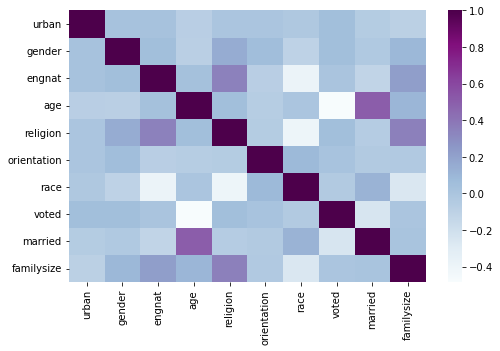

In [22]:
from matplotlib import pyplot as plt
plt.figure(figsize=(8, 5))
sb.heatmap(demo_features.corr(method = 'spearman'), cmap='BuPu')

### Plot pie charts to understand the sample population

In [23]:
# Distribution of age group

def make_pie_chart(data, series, title):
    temp_series = data[ series ].value_counts()
        # What we want to show in our charts

    labels = ( np.array(temp_series.index) )
    sizes = ( np.array( ( temp_series / temp_series.sum() ) *100) )

    trace = go.Pie(labels=labels, 
                   values=sizes)
    layout= go.Layout(
        title= title,
        title_font_size= 24,
        #title_font_color= 'red',
        #title_x= 0.45,
    )
    fig = go.Figure(data= [trace],
                    layout=layout)

    fig.show()
    
make_pie_chart(df, 'age_group', 'Distribution by Age')  

In [24]:
mean_age_Anxiety = df.groupby(df["TIPI4"] == 1)["age"].mean()
print("Average age of people identifying as axious/ easily upset is " + str("%.2f" % mean_age_Anxiety.iloc[1]) + " years")

Average age of people identifying as axious/ easily upset is 26.17 years


In [25]:
# Distribution of gender
temp = df.copy()
temp['gender'].replace({
    1: "Male",
    2: "Female",
    3: "Non-binary",
    0: "Unknown",
},
    inplace=True)

make_pie_chart(temp, 'gender', 'Distribution by Gender')

In [26]:
# Distribution of education level
temp = df.copy()
temp['education'].replace({
    1: "Less than high school",
    2: "High school",
    3: "University degree",
    4: "Graduate degree",
},
    inplace=True)

make_pie_chart(temp, 'education', 'Distribution by Education')

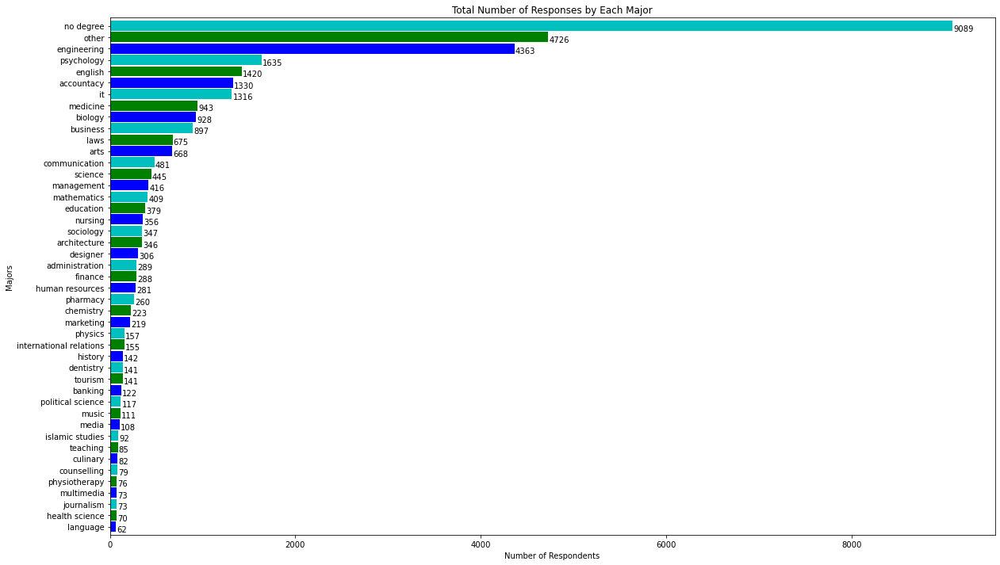

In [27]:
# Distribution of college majors
plt.figure(figsize=(20,12))
df['major'].value_counts().sort_values(ascending= True).plot(kind='barh', 
                                                             width = 0.9,
                                                             color=list('bgc'))

for i, v in enumerate(df['major'].value_counts().sort_values(ascending= True)):
    plt.text(v + 10, i - 0.45, str(v), color='black', fontweight='normal')

_ = plt.xlabel("Number of Respondents")
_ = plt.ylabel("Majors")
_ = plt.title("Total Number of Responses by Each Major")

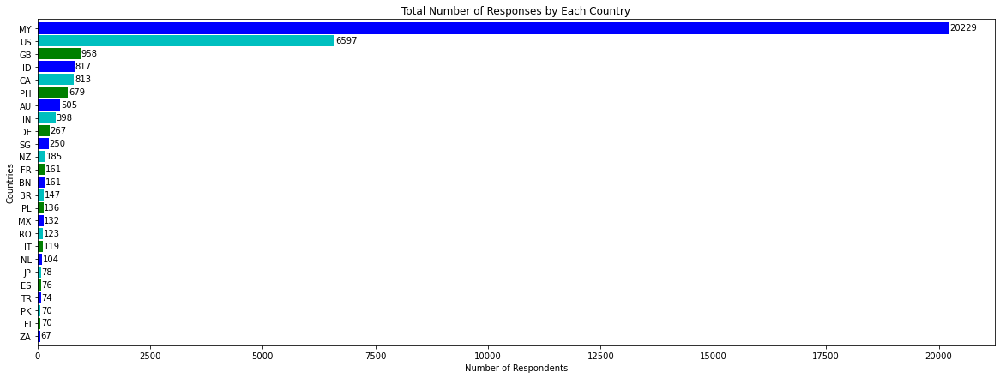

In [28]:
# Distribution of country of origin
plt.rcParams["figure.figsize"] = (20,7)

df['country'].value_counts()[:25].sort_values(ascending= True).plot(kind='barh', 
                                                             width = 0.9,
                                                             color=list('bgc'))

for i, v in enumerate(df['country'].value_counts()[:25].sort_values(ascending= True)):
    plt.text(v + 10, i - 0.15, str(v), color='black', fontweight='normal')

_ = plt.xlabel("Number of Respondents")
_ = plt.ylabel("Countries")
_ = plt.title("Total Number of Responses by Each Country")

plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

In [29]:
# Distribution of sexual orientation
temp = df.copy()
temp['orientation'].replace({
    1: "Heterosexual",
    2: "Bisexual",
    3: "Homosexual",
    4: "Asexual",
    5: "Other",
    0: "Unknown",
},
    inplace=True)

make_pie_chart(temp, 'orientation', 'Distribution by Sexual Orientation')

In [30]:
# Distribution of marriage status
temp = df.copy()
temp['married'].replace({
    1: "Never",
    2: "Currently married",
    3: "Previously married",
    0: "Unknown",
},
    inplace=True)

make_pie_chart(temp, 'married', 'Distribution by Marriage Status')

In [31]:
# Distribution of religion
temp = df.copy()
temp['religion'].replace({
    1: 'Agnostic',
    2: 'Atheist',
    3: 'Buddhist',
    4: 'Christian',
    5: 'Christian',
    6: 'Christian',
    7: 'Christian', 
    8: 'Hindu',
    9: 'Jewish',
    10: 'Muslim',
    11: 'Sikh',
    12: 'Other',
    0: 'Unknown',
},
    inplace=True)
# The 'Christian' category was originally further subdivided into Catholics, Mormons, Protestants etc.
# We choose to group all Christians together to distinguish the different sections of the pie chart 

make_pie_chart(temp, 'religion', 'Distribution by Religion')

In [32]:
# Distribution of race
temp = df.copy()
temp['race'].replace({
    10: 'Asian',
    20: 'Arab',
    30: 'Black',
    40: 'Indigenous',
    50: 'Native American',
    60: 'White',
    70: 'Other',
    0: 'Unknown',
},
    inplace=True)

make_pie_chart(temp, 'race', 'Distribution by Race')

Notice the sample overwhelmingly comes from 18-24 year old, female, Malaysian, Muslim, Asian respondents. This raises concerns of sampling bias and suggests there may have been a controlled study that was  undertaken via data collection done with this survey. The sampling population is certainly not representative therefore if we use demographics to predict DAS symptoms the results cannot be generalised.

Another study could be one reason for the high number of Malaysian Muslim entries, as we see more than 60% are degree-level, unmarried young adults, quite a lot of whom study engineering or psychology. Alternatively there could have been spammers using a Malaysian VPN to fill in the survey as we do not know from the data how VPNs affect the result. However, if we truncate the Malaysian entries, many of the other categories remain proportionally stable.

## Visualise survey score related to each question category

### Plot correlation heatmaps to visualise the data

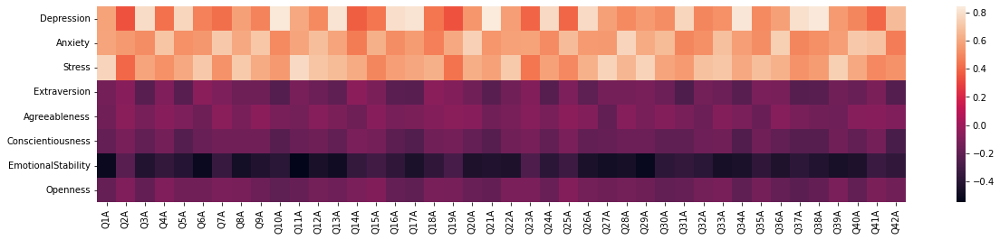

In [33]:
corr = df.filter(regex='.*(?<!cat)$').corr(method = 'spearman')
corr = corr.iloc[-8:]

plt.figure(figsize = (20, 4))
dataplot = sb.heatmap(corr.filter(regex='Q\d*A'))
mp.show()

Emotional stability is negatively correlated with DAS score i.e. emotionally unstable individuals are likely to suffer from more severe symptoms of DAS.

### Make correlation plot to find possible association between each question

<AxesSubplot:>

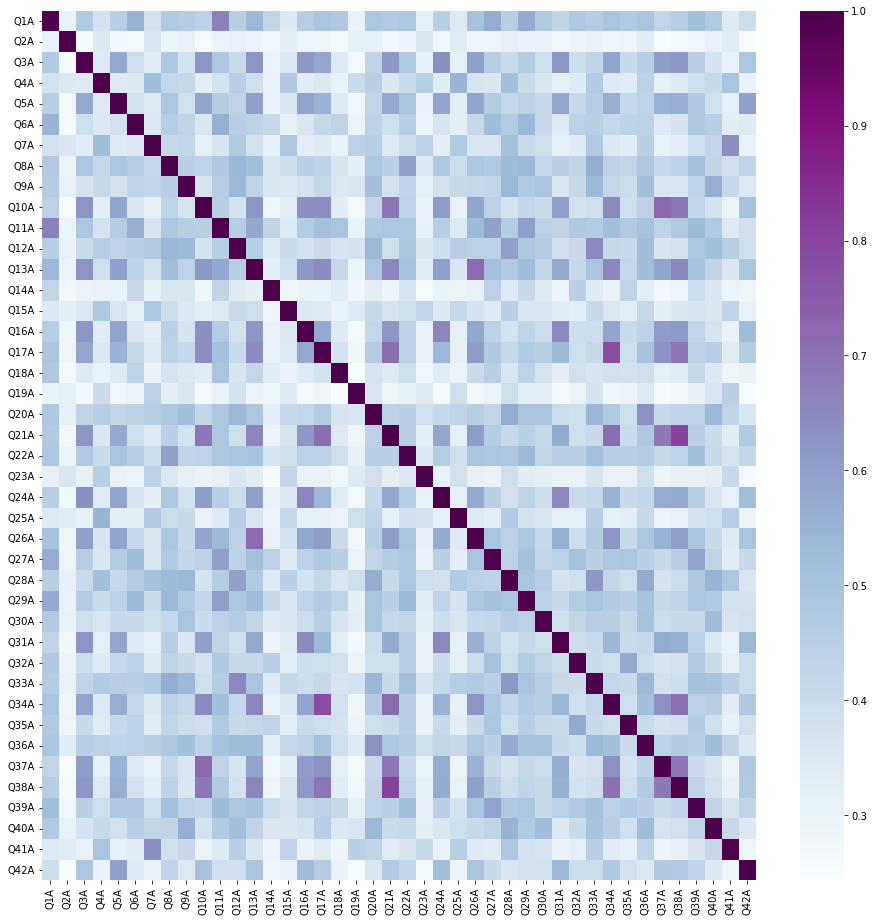

In [34]:
# Extract the columns with just the answers to the first 42 questions
df2 = df.loc [:,::3]
df3 = df2.iloc[:,0:42]
df3.head()

plt.figure(figsize = (16, 16))
sb.heatmap(df3.corr(method = 'spearman'), cmap='BuPu')

In [35]:
df3.describe()
# The majority of people admit to symptoms of anxiety and depression in particular

,Q1A,Q2A,Q3A,Q4A,Q5A,Q6A,Q7A,Q8A,Q9A,Q10A,...,Q33A,Q34A,Q35A,Q36A,Q37A,Q38A,Q39A,Q40A,Q41A,Q42A
count,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,...,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000,34921.000000
mean,2.613728,2.167006,2.207926,1.928610,2.502534,2.529796,1.902752,2.456717,2.663269,2.433292,...,2.391255,2.622978,2.287220,2.258412,2.358753,2.374044,2.429913,2.646373,1.942814,2.662495
std,1.025988,1.107276,1.027698,1.027444,1.061430,1.041373,1.018272,1.043976,1.062203,1.133865,...,1.041566,1.147238,0.986031,1.098970,1.132711,1.181281,1.010692,1.100610,1.031863,1.026205
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,2.000000,2.000000,1.000000,...,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,2.000000
50%,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,...,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,3.000000
75%,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,...,3.000000,4.000000,3.000000,3.000000,3.000000,4.000000,3.000000,4.000000,3.000000,4.000000
max,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,...,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000


### Now extract the personality test results

Index of TIPI1 column: 131


<AxesSubplot:ylabel='TIPI4'>

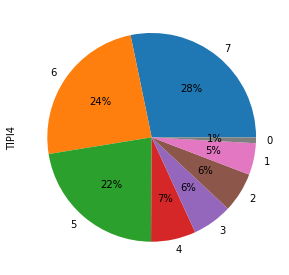

In [36]:
print("Index of TIPI1 column: " + str(df.columns.get_loc("TIPI1")))
df4 = df.iloc[:,131:141]
df4.head()

# Plot pie chart to see how many people are anxious/ easily upset
df4['TIPI4'].value_counts().plot(kind='pie', autopct='%1.0f%%')

About 52% of respondents moderately/ strongly agrees that they are anxious and easily upset.

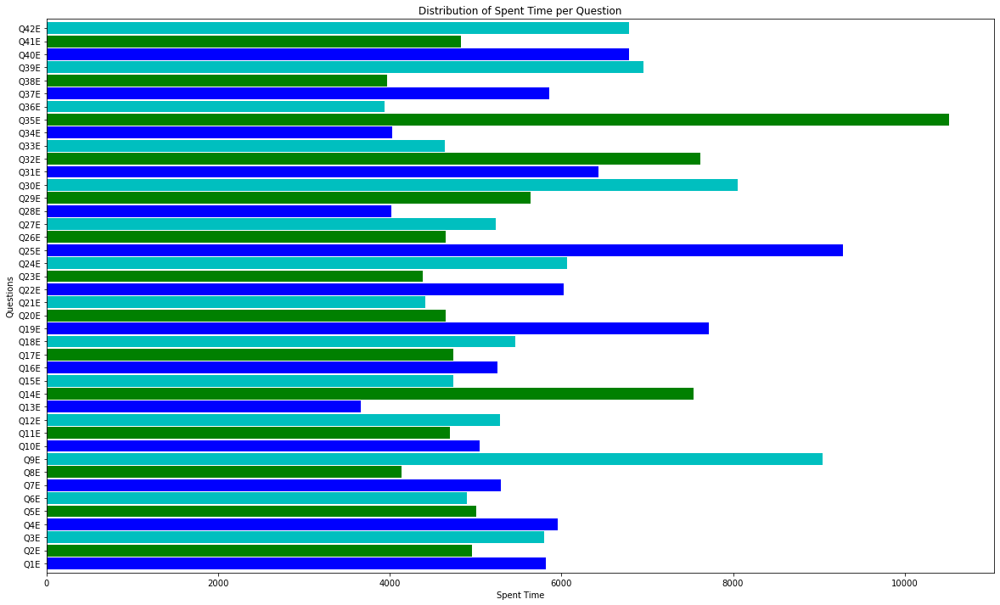

In [37]:
df_time = df.copy() # to preserve the data
df_time.iloc[:,0:126]
questions = [i for i in df_time.iloc[:,0:126] if  'A' in i]
time = [i for i in df_time.iloc[:,0:126] if  'E' in i]
position = [i for i in df_time.iloc[:,0:126] if  'I' in i]

item_positions = df_time[position] # if needed
dass = df_time[questions]
testelapse = df_time[time]
df_time.drop(position, axis=1, inplace=True)

testelapse = df_time[time]
df_time['testelapse'] = np.sum(df_time[time],axis=1) / 1000
# Total time spent is not equal to 'testelapse', calculated time elapsed is much more reliable

# Drop time related features
df_time.drop(df_time[time],axis=1, inplace=True)
df_time.drop(df_time[questions],axis=1, inplace= True)

plt.figure(figsize=(20,12))
testelapse[[x for x in testelapse.columns if 'E' in x]].mean().plot(kind = 'barh', 
                                                                    width = 0.9,
                                                                    color = list('bgc'),
                                                                  )
_ = plt.xlabel("Spent Time")
_ = plt.ylabel("Questions")
_ = plt.title("Distribution of Spent Time per Question")

The longest amounts of time were spent on question 35, followed by question 25 and 9.

### Score by class, controlled for age

In [38]:
temp = df.copy()
temp['score'] = df3.iloc[:, 0:42].sum(axis= 1)
temp['mean_score'] = temp['score'] / 42

In [39]:
def make_box_plot_by_age(temp, color):
    fig = px.box(
        temp, 
        x= 'age_group',
        y= 'mean_score',
        color= color,
        category_orders= {
            "age_group": ['below 18',
                          '18 to 24',
                          '25 to 34',
                          '35 to 44',
                          '45 to 54',
                          '55 to 64',
                          'above 65'],
            color: ordering,
            #temp[ color ].unique(),
        },
    )

    fig.update_layout(
        title= f'DASS Score, by age, by { color }',
        title_x = 0.5,
        title_font_size= 20,
        height= 600,
        width= 900,
        showlegend= True
    )

    fig.show()

In [40]:
temp['gender'].replace({
    1: "Male",
    2: "Female",
    3: "Non-binary",
    0: "Unknown",
},
    inplace=True)

ordering = [
    'Male',
    'Female',
    'Non-binary',
    'Unknown',
]

make_box_plot_by_age(temp, 'gender')

Minority and typically disadvantaged groups are most susceptible to worse DAS symptoms. However note that the distribution for racial groups especially is very unbalanced so this result cannot be generalised. Some of the trends shown by these plots are most likely a result of undersampling of certain groups.

Women consistently score higher than men, suggesting the stereotypes of men being typically avoidant in expressing negative feelings may be true. That said, we did not control for variables other than age so it's difficult to conclude that gender alone means women are more likely to be depressed, anxious or stressed than men.

In [41]:
temp['orientation'].replace({
    1: "Heterosexual",
    2: "Non-heterosexual",
    3: "Non-heterosexual",
    4: "Non-heterosexual",
    5: "Non-heterosexual",
    0: "Unknown",
},
    inplace=True)

ordering = [
    "Heterosexual",
#     "Bisexual",
#     "Homosexual",
#     "Asexual",
#     "Other",
    "Non-heterosexual",
    "Unknown",
]
    
make_box_plot_by_age(temp, 'orientation')

It's difficult to make assumptions about the effect of sexual orientation from the plot above, however we can say that at least in this study non-heterosexual people collectively score higher on the DASS survey.

### Survey result visualisation

In [42]:
# 'I' (the position of the question) and 'E' (time taken to answer the question) are dropped from the dataframe for this part
main = df.iloc[:, 0:126]
other = df.iloc[:, 126:]
main_ans_only = main[main.columns[::3]]

ndf = pd.concat([main_ans_only, other], axis=1)
ndf.head(2)

,Q1A,Q2A,Q3A,Q4A,Q5A,Q6A,Q7A,Q8A,Q9A,Q10A,...,Depression_cat,Anxiety,Anxiety_cat,Stress,Stress_cat,Extraversion,Agreeableness,Conscientiousness,EmotionalStability,Openness
0,4,4,2,4,4,4,4,4,2,1,...,3,34,4,40,4,0.5,4.5,4.5,0.5,6.5
1,4,1,2,3,4,4,3,4,3,2,...,3,17,3,27,3,4.5,4.5,2.0,0.5,3.5


In [43]:
%%capture --no-display

labeled = [
    'I found myself getting upset by quite trivial things.',
    
    'I was aware of dryness of my mouth.',
    
    'I couldn\'t seem to experience any positive feeling at all.',
    
    'I experienced breathing difficulty.',
    
    'I just couldn\'t seem to get going',
    
    'I tended to over-react to situations.',
    
    'I had a feeling of shakiness.',
    
    'I found it difficult to relax.',
    
    'I found myself in situations that made me so anxious I was most relieved when they ended.',
    
    'I felt that I had nothing to look forward to.',
    
    'I found myself getting upset rather easily.',
    
    'I felt that I was using a lot of nervous energy.',
    
    'I felt sad and depressed.',
    
    'I found myself getting impatient when I was delayed in any way.',
    
    'I had a feeling of faintness.',
    
    'I felt that I had lost interest in just about everything.',
    
    'I felt I wasn\'t worth much as a person.',
    
    'I felt that I was rather touchy.',
    
    'I perspired noticeably (eg, hands sweaty) in the absence of high temperatures or physical exertion.',
    
    'I felt scared without any good reason.',
    
    'I felt that life wasn\'t worthwhile.',
    
    'I found it hard to wind down.',
    
    'I had difficulty in swallowing.',
    
    'I couldn\'t seem to get any enjoyment out of the things I did.',
    
    'I was aware of the action of my heart in the absence of physical exertion.',
    
    'I felt down-hearted and blue.',
    
    'I found that I was very irritable.',
    
    'I felt I was close to panic.',
    
    'I found it hard to calm down after something upset me.',
    
    'I feared that I would be "thrown" by some trivial but unfamiliar task.',
    
    'I was unable to become enthusiastic about anything.',
    
    'I found it difficult to tolerate interruptions to what I was doing.',
    
    'I was in a state of nervous tension.',
    
    'I felt I was pretty worthless.',
    
    'I was intolerant of anything that kept me from getting on with what I was doing.',
    
    'I felt terrified.',
    
    'I could see nothing in the future to be hopeful about.',
    
    'I felt that life was meaningless.',
    
    'I found myself getting agitated.',
    
    'I was worried about situations in which I might panic and make a fool of myself.',
    
    'I experienced trembling (eg, in the hands).',
    
    'I found it difficult to work up the initiative to do things.',
]


def question(data, number_of_questions):
    q = data.iloc[:, 0:number_of_questions]
    qs = q.T.copy()
    

    qs['no ans']     = q[q == 0].count()
    qs['not at all'] = q[q == 1].count()
    qs['some times'] = q[q == 2].count()
    qs['many times'] = q[q == 3].count()
    qs['most times'] = q[q == 4].count()
    
    qs['total'] = qs[ ['not at all', 
                       'some times', 
                       'many times', 
                       'most times'] ].sum(axis= 1)
    

    qs.reset_index(level=0, inplace=True)
    qs = qs.rename(columns= {'index': 'question'})   

    qs['p_na']     = round( qs['no ans'] * 100 / qs['total'], 2)
    qs['p_not']    = round( qs['not at all'] * 100 / qs['total'], 2)
    qs['p_slight'] = round( qs['some times'] * 100 / qs['total'], 2)
    qs['p_mainly'] = round( qs['many times'] * 100 / qs['total'], 2)
    qs['p_very']   = round( qs['most times'] * 100 / qs['total'], 2)
    
    
    choices = [
        'question',
        'no ans',
        'not at all',
        'some times',
        'many times',
        'most times',
        'total',
        'p_na',
        'p_not',
        'p_slight',
        'p_mainly',
        'p_very',
    ]

    clean = qs[choices]
    clean['labeled_question'] = np.asarray(labeled).flatten()
    
    return clean

question(ndf, 42)

,question,no ans,not at all,some times,many times,most times,total,p_na,p_not,p_slight,p_mainly,p_very,labeled_question
0,Q1A,0,5284,11877,8804,8956,34921,0.0,15.13,34.01,25.21,25.65,I found myself getting upset by quite trivial ...
1,Q2A,0,12626,10189,5754,6352,34921,0.0,36.16,29.18,16.48,18.19,I was aware of dryness of my mouth.
2,Q3A,0,10226,12547,6809,5339,34921,0.0,29.28,35.93,19.50,15.29,I couldn't seem to experience any positive fee...
3,Q4A,0,15757,9910,5244,4010,34921,0.0,45.12,28.38,15.02,11.48,I experienced breathing difficulty.
4,Q5A,0,7074,11456,8159,8232,34921,0.0,20.26,32.81,23.36,23.57,I just couldn't seem to get going
5,Q6A,0,6363,11916,8420,8222,34921,0.0,18.22,34.12,24.11,23.54,I tended to over-react to situations.
6,Q7A,0,16087,10023,4931,3880,34921,0.0,46.07,28.70,14.12,11.11,I had a feeling of shakiness.
7,Q8A,0,7189,12102,8122,7508,34921,0.0,20.59,34.66,23.26,21.50,I found it difficult to relax.
8,Q9A,0,5669,10552,8569,10131,34921,0.0,16.23,30.22,24.54,29.01,I found myself in situations that made me so a...
9,Q10A,0,9384,9798,6963,8776,34921,0.0,26.87,28.06,19.94,25.13,I felt that I had nothing to look forward to.


In [44]:
%%capture --no-display

top_labels = ['Did not<br> apply to me', 
              'Sometimes<br>applied to me',
              'Considerably<br> applied to me', 
              'Very much<br>applied to me',]

colors     = [ 
    '#A2D3C2',
    '#658E9C',
    '#4D5382',
    '#514663'
]

y_data= [
'I found myself getting upset by quite trivial things.',

'I was aware of dryness of my mouth.',

'I couldn\'t seem to experience any positive feeling at all.',

'I experienced breathing difficulty.',

'I just couldn\'t seem to get going',

'I tended to over-react to situations.',

'I had a feeling of shakiness.',

'I found it difficult to relax.',

'I found myself in situations that made me so anxious<br>\
I was most relieved when they ended.',

'I felt that I had nothing to look forward to.',

'I found myself getting upset rather easily.',

'I felt that I was using a lot of nervous energy.',

'I felt sad and depressed.',

'I found myself getting impatient when I was delayed in any way.',

'I had a feeling of faintness.',

'I felt that I had lost interest in just about everything.',

'I felt I wasn\'t worth much as a person.',

'I felt that I was rather touchy.',

'I perspired noticeably (eg, hands sweaty) in the<br>\
absence of high temperatures or physical exertion.',

'I felt scared without any good reason.',

'I felt that life wasn\'t worthwhile.',

'I found it hard to wind down.',

'I had difficulty in swallowing.',

'I couldn\'t seem to get any enjoyment out of the things I did.',

'I was aware of the action of my heart in the<br>\
absence of physical exertion.',

'I felt down-hearted and blue.',

'I found that I was very irritable.',

'I felt I was close to panic.',

'I found it hard to calm down after something upset me.',

'I feared that I would be "thrown" by some trivial but unfamiliar task.',

'I was unable to become enthusiastic about anything.',

'I found it difficult to tolerate interruptions to what I was doing.',

'I was in a state of nervous tension.',

'I felt I was pretty worthless.',

'I was intolerant of anything that kept me from getting on<br>\
with what I was doing.',

'I felt terrified.',

'I could see nothing in the future to be hopeful about.',

'I felt that life was meaningless.',

'I found myself getting agitated.',

'I was worried about situations in which I might panic<br>\
and make a fool of myself.',

'I experienced trembling (eg, in the hands).',

'I found it difficult to work up the initiative to do things.',
]


def plot_likert(data, title, height= 1400, width= 1000):
    x_data = np.array( data[ ['p_not',
                              'p_slight',
                              'p_mainly',
                              'p_very',] ] )

    
    fig = go.Figure()
    
    
    for i in range(0, len(x_data[0])):
        for xd, yd in zip(x_data, y_data):
            fig.add_trace(go.Bar(
                x=[xd[i]], y=[yd],
                orientation='h',
                marker=dict(
                    color=colors[i],
                    line=dict(color='rgb(248, 248, 249)', width=1)
                )
            ))

    
    fig.update_layout(
        xaxis=dict(
            showgrid=False,
            showline=False,
            showticklabels=False,
            zeroline=False,
            domain=[0.15, 1]
        ),
        yaxis=dict(
            showgrid=False,
            showline=False,
            showticklabels=False,
            zeroline=False,
            autorange= 'reversed',
                # flipping order of the bar charts
        ),
        barmode='stack',
        paper_bgcolor='rgb(248, 248, 255)',
        plot_bgcolor='rgb(248, 248, 255)',
        margin= dict(l=120, r=10, t=140, b=80),
        showlegend=False,
        height= height,
        width= width,
        title={
            'text': title,
            'font_size': 28,
            'font_color': 'black',
            'x': 0.5
        },
    )
    
    
    annotations = []

    for yd, xd in zip(y_data, x_data):
        # labeling the y-axis
        annotations.append(dict(xref='paper', yref='y',
                                x=0.14, y=yd,
                                xanchor='right',
                                text=str(yd),
                                font=dict(family='Arial', size=10,
                                          color='rgb(67, 67, 67)'),
                                showarrow=False, align='right'))
        
        # labeling the first percentage of each bar (x_axis)
        annotations.append(dict(xref='x', yref='y',
                                x=xd[0] / 2, y=yd,
                                text=str(xd[0]) + '%',
                                font=dict(family='Arial', size=14,
                                          color='rgb(248, 248, 255)'),
                                showarrow=False))
        
        # labeling the first Likert scale (on the top)
        if yd == y_data[-1]:
            annotations.append(dict(xref='x', yref='paper',
                                    x= xd[0] / 2, y= 1.02,
                                    text= top_labels[0],
                                    font=dict(family='Arial', size=16,
                                              
                                              color='rgb(67, 67, 67)'),
                                    showarrow= False))

        space = xd[0]
        for i in range(1, len(xd)):
            # labeling the rest of percentages for each bar (x_axis)
            annotations.append(dict(xref='x', yref='y',
                                    x=space + (xd[i]/2), y=yd,
                                    text=str(xd[i]) + '%',
                                    font=dict(family='Arial', size=14,
                                              color='rgb(248, 248, 255)'),
                                    showarrow=False))
            # labeling the Likert scale
            if yd == y_data[0]:
                # 13th question was used because the scale is more normally distributed
                annotations.append(dict(xref='x', yref='paper',
                                        x=space + (xd[i]/2), y=1.02,
                                        text=top_labels[i],
                                        font=dict(family='Arial', size=16,
                                                  color='rgb(67, 67, 67)'),
                                        showarrow=False))
            space += xd[i]

    
    fig.update_layout(annotations=annotations)
    fig.show()
    
plot_likert(question(ndf, 42), 'DASS Results', height=2100, width= 1400)

Questions where the highest amount of respondents (> 30%) felt a certain way most of the time were, respectively:

13 - I felt sad and depressed.

11 - I found myself getting upset rather easily.

17 - I felt I wasn't worth much as a person.

34 - I felt I was pretty worthless.

40 - I was worried about situations in which I might panic and make a fool of myself.

On the contrary, most respondents answered "did not apply to me at all" to these questions:

23 - I had difficulty in swallowing. (63.95%)

15 - I had a feeling of faintness. (49.89%)

19 - I perspired noticeably (e.g. hands sweaty) in the absence of high temperatures or physical exertion. (47.07%)

Therefore most patients appear to have non-physical symptoms of DAS.

In [45]:
def select_question(lst, question_number):    
    rows =[]
    for i in range(len(lst)):
        rows.append( lst[i].iloc[ question_number-1 ] )
    
    df = pd.concat(rows, axis=1)
    
    return df.T.iloc[:, -5:]

def plot_bar_wtrends(data, group, colors, title, legend= False):

    labeled_range = [
        'Not at all like me',
        'Slightly like me',
        'Mainly like me',
        'Very much like me',
    ]

    
    t = data.T \
        .set_axis( group, axis=1, inplace=False ) \
        .rename_axis('ind', axis=0) \
        .reset_index()

    transpose = t.iloc[:-1]
    transpose['ind'] = labeled_range
      
    
    trace = []
    
    for i in range(len(group)):
        trace.append(
            go.Bar(
                x= transpose.ind,
                y= transpose[ group[i] ],
                name= group[i],
                marker_color= colors[i]
            )
        )
        
    fig = go.Figure(data = trace)

       
    fig.update_layout(
        title={
            'text': title,
            'font_size': 14,
            'font_color': 'darkgreen',
            'x': 0.5
        },
        xaxis_tickfont_size=14,
        yaxis=dict(
            title='',
            titlefont_size=16,
            tickfont_size=14,
        ),
        legend=dict(
            x=0.995,
            y=0.98,
            bgcolor='rgba(255, 255, 255, 0)',
            bordercolor='rgba(255, 255, 255, 0)',
        ),
        showlegend= legend,
        barmode='group',
        bargap=0.25, 
        bargroupgap=0.1 
    )
    
    return fig.show()

In [46]:
%%capture --no-display
# Traffic source trends

source_group= [
    'Front page of survey site',
    'Google redirect',
    'Other',
]

df_1 = ndf[ ndf['source'] == 1 ]
df_2 = ndf[ ndf['source'] == 2 ]
df_3 = ndf[ ndf['source'] == 0 ]

sources = [
    question(df_1, 42),
    question(df_2, 42),
    question(df_3, 42)
]

colors = [
    '#74C69D',
    '#48cae4',
    '#00b4d8',
    '#0096c7',
    '#0077b6',
    '#023e8a'
]

for i in range(2):
    plot_bar_wtrends(select_question(sources, i), 
                     source_group, 
                     colors,
                     f'{y_data[i]}', legend= True) 

### Correlation matrix of category scores against questions

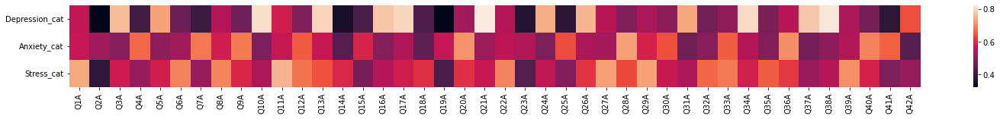

In [47]:
question_dascat = ndf.filter(regex='Q\d+A|_cat')
question_dascat_corr = question_dascat.corr(method = 'spearman').iloc[42:,:-3]

plt.figure(figsize = (25, 2))
dataplot = sb.heatmap(question_dascat_corr)
mp.show()

### Sorted question items based on correlation score

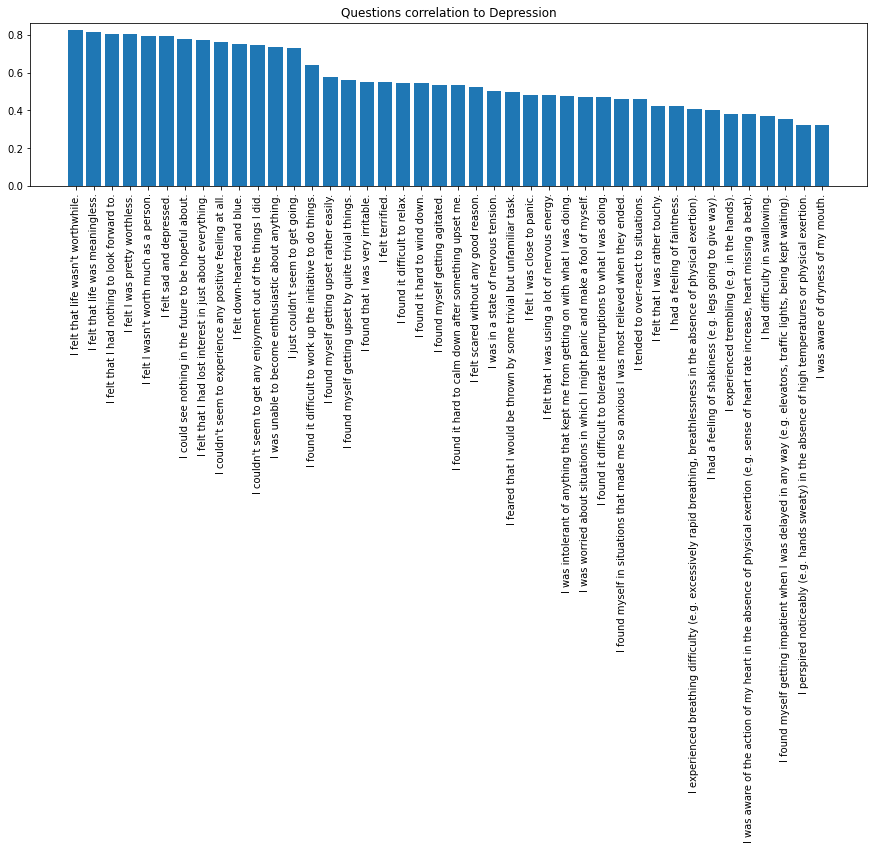

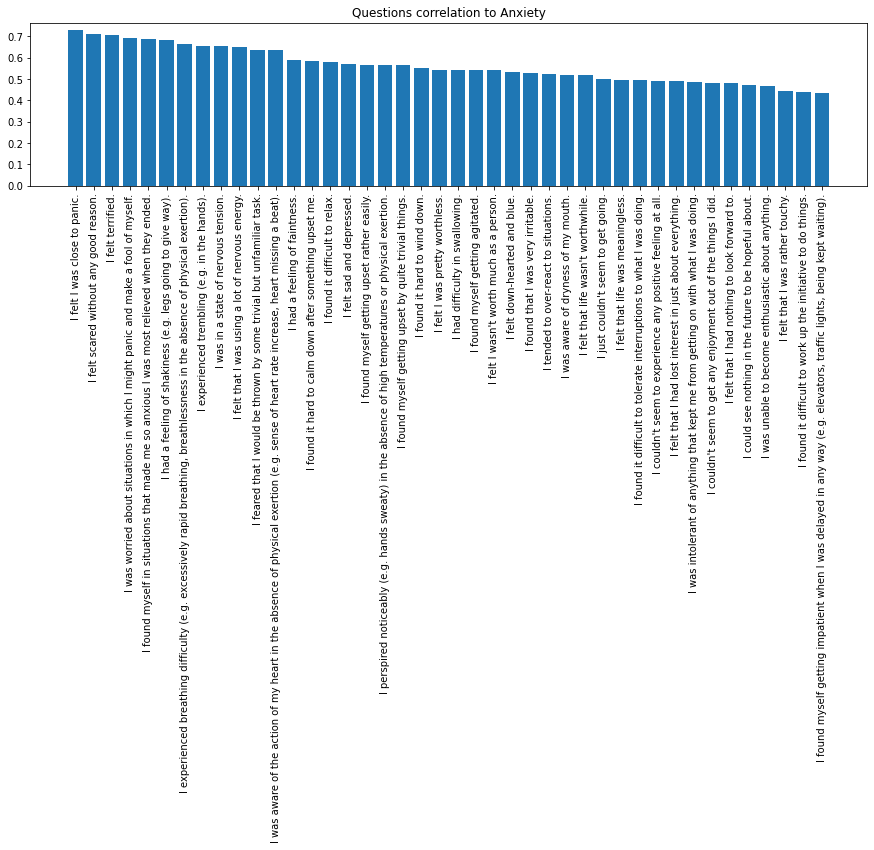

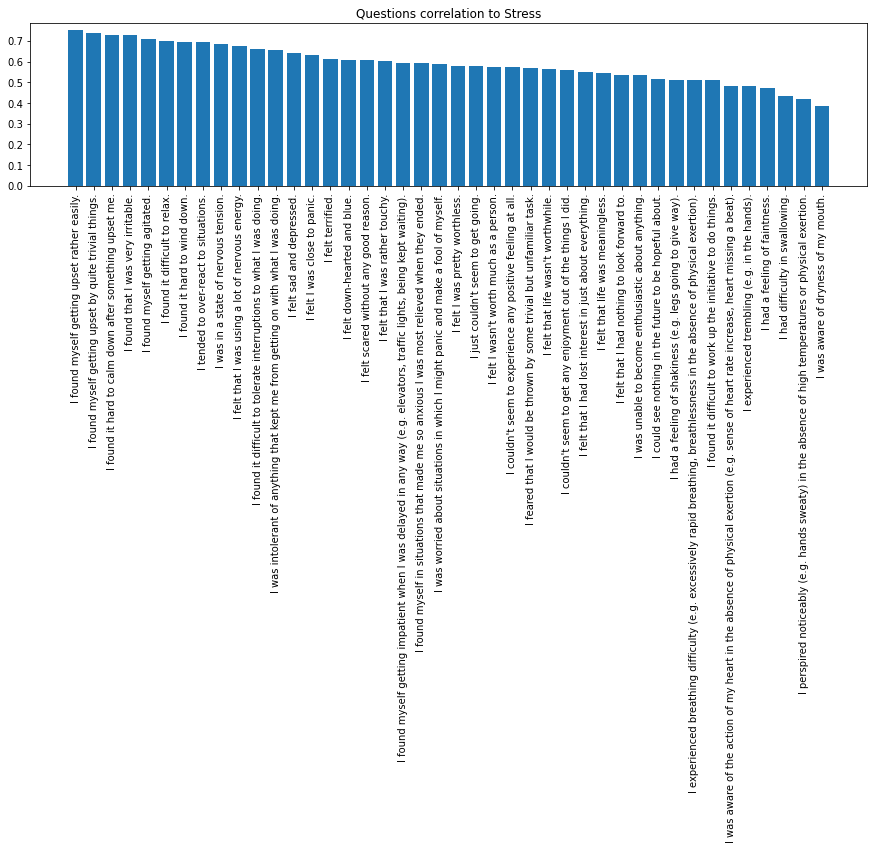

In [48]:
for category in ['Depression', 'Anxiety', 'Stress']:
    sorted_correlation = question_dascat_corr.loc[category + '_cat'].sort_values(ascending=False)
    sorted_correlation.index = [questions_dict[q] for q in sorted_correlation.index]
    
    fig = plt.figure(figsize =(15, 3))
    plt.bar(sorted_correlation.index, sorted_correlation.values)
    plt.xticks(rotation=90)
    plt.title('Questions correlation to {}'.format(category))
    plt.show()

### Visualise correlation of individual questions to each category

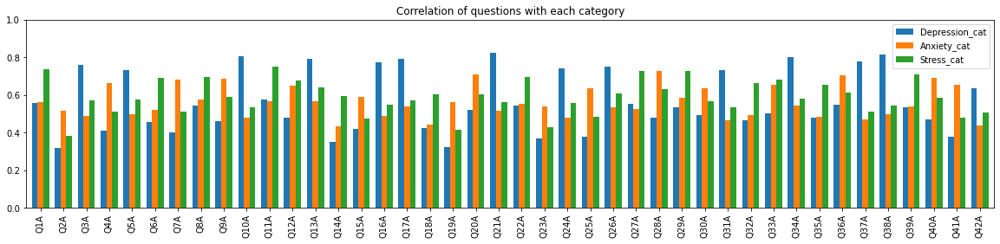

In [49]:
ax = question_dascat_corr.T.plot.bar(figsize=(20, 4), width=0.75, ylim=(0,1), 
                                     title='Correlation of questions with each category')

### Sorted Pearson correlation of question items to each category

In [50]:
for category in ['Depression', 'Anxiety', 'Stress']:
    sorted_correlation = question_dascat_corr.loc[category + '_cat'].sort_values(ascending=False)
    sorted_correlation.index = [questions_dict[q] for q in sorted_correlation.index]
    
    print(category + '_cat')
    print(sorted_correlation[:5])
    print()

Depression_cat
I felt that life wasn't worthwhile.              0.823767
I felt that life was meaningless.                0.817318
I felt that I had nothing to look forward to.    0.805630
I felt I was pretty worthless.                   0.801940
I felt I wasn't worth much as a person.          0.794461
Name: Depression_cat, dtype: float64

Anxiety_cat
I felt I was close to panic.                                                                 0.727304
I felt scared without any good reason.                                                       0.712015
I felt terrified.                                                                            0.707692
I was worried about situations in which I might panic and make a fool of myself.             0.693609
I found myself in situations that made me so anxious I was most relieved when they ended.    0.685048
Name: Anxiety_cat, dtype: float64

Stress_cat
I found myself getting upset rather easily.               0.750514
I found myself getting

## Random Forest Modelling

### Recursive feature elimination with cross-validation to select optimal number of features

Category : Depression
Optimal number of features : 14


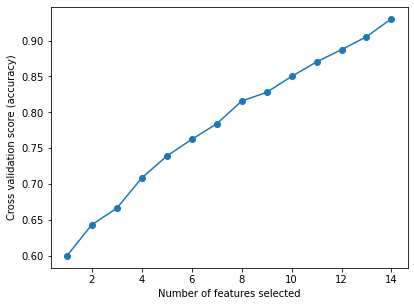

Questions
Q3A : I couldn't seem to experience any positive feeling at all.
Q5A : I just couldn't seem to get going.
Q10A : I felt that I had nothing to look forward to.
Q13A : I felt sad and depressed.
Q16A : I felt that I had lost interest in just about everything.
Q17A : I felt I wasn't worth much as a person.
Q21A : I felt that life wasn't worthwhile.
Q24A : I couldn't seem to get any enjoyment out of the things I did.
Q26A : I felt down-hearted and blue.
Q31A : I was unable to become enthusiastic about anything.
Q34A : I felt I was pretty worthless.
Q37A : I could see nothing in the future to be hopeful about.
Q38A : I felt that life was meaningless.
Q42A : I found it difficult to work up the initiative to do things.



Category : Anxiety
Optimal number of features : 14


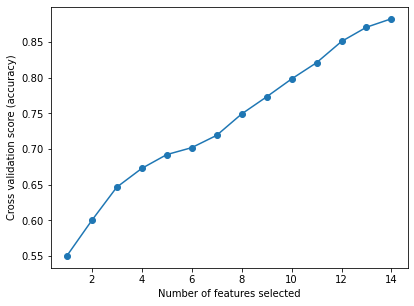

Questions
Q2A : I was aware of dryness of my mouth.
Q4A : I experienced breathing difficulty (e.g. excessively rapid breathing, breathlessness in the absence of physical exertion).
Q7A : I had a feeling of shakiness (e.g. legs going to give way).
Q9A : I found myself in situations that made me so anxious I was most relieved when they ended.
Q15A : I had a feeling of faintness.
Q19A : I perspired noticeably (e.g. hands sweaty) in the absence of high temperatures or physical exertion.
Q20A : I felt scared without any good reason.
Q23A : I had difficulty in swallowing.
Q25A : I was aware of the action of my heart in the absence of physical exertion (e.g. sense of heart rate increase, heart missing a beat).
Q28A : I felt I was close to panic.
Q30A : I feared that I would be thrown by some trivial but unfamiliar task.
Q36A : I felt terrified.
Q40A : I was worried about situations in which I might panic and make a fool of myself.
Q41A : I experienced trembling (e.g. in the hands).



Categor

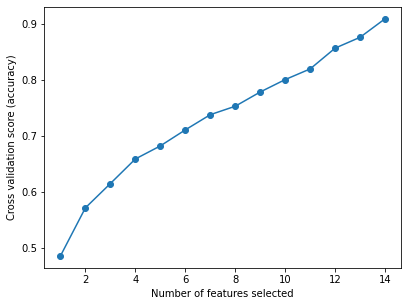

Questions
Q1A : I found myself getting upset by quite trivial things.
Q6A : I tended to over-react to situations.
Q8A : I found it difficult to relax.
Q11A : I found myself getting upset rather easily.
Q12A : I felt that I was using a lot of nervous energy.
Q14A : I found myself getting impatient when I was delayed in any way (e.g. elevators, traffic lights, being kept waiting).
Q18A : I felt that I was rather touchy.
Q22A : I found it hard to wind down.
Q27A : I found that I was very irritable.
Q29A : I found it hard to calm down after something upset me.
Q32A : I found it difficult to tolerate interruptions to what I was doing.
Q33A : I was in a state of nervous tension.
Q35A : I was intolerant of anything that kept me from getting on with what I was doing.
Q39A : I found myself getting agitated.





In [51]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV

for category in ['Depression', 'Anxiety', 'Stress']:
    clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0)
    # The "accuracy" scoring shows the proportion of correct classifications

    min_features_to_select = 1  # Minimum number of features to consider
    rfecv = RFECV(
        estimator=clf,
        step=1,
        scoring="accuracy",
        min_features_to_select=min_features_to_select,
    )
    rfecv.fit(question_dascat[['Q'+str(q)+'A' for q in DASS_keys[category]]], 
              question_dascat[category+'_cat'])

    print('Category :', category)
    print("Optimal number of features : %d" % rfecv.n_features_)

    # Plot number of features VS. cross-validation scores
    plt.figure()
    plt.xlabel("Number of features selected")
    plt.ylabel("Cross validation score (accuracy)")
    plt.plot(
        range(min_features_to_select, len(rfecv.grid_scores_) + min_features_to_select),
        rfecv.grid_scores_,
        marker='o'
    )
    plt.show()
    
    print('Questions')
    for q in np.array(['Q'+str(q)+'A' for q in DASS_keys[category]])[rfecv.support_]:
        print(q + ' : ' + questions_dict[q])
    print('\n'*2)    

### Random forest is an ensemble of n decision trees

We plot decision trees to understand the model better. Note we only plotted a decision tree of max depth 3, adhering to space constraint. Usually random forests consist of 100s or 1000s of decision trees of depth of around 20. The final classification output from the random forest is an ensemble of predictions of all decision trees.

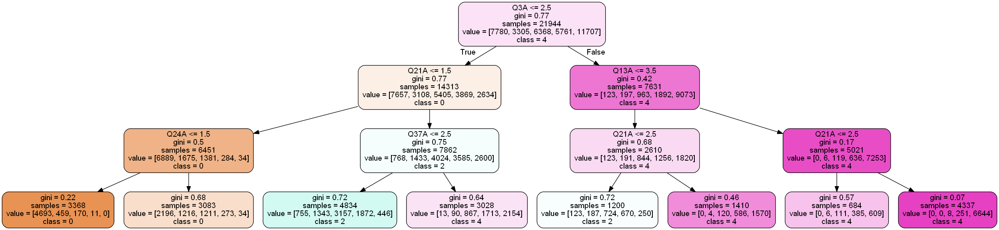

In [52]:
for category in ['Depression']:
    model = RandomForestClassifier(n_estimators=100, max_depth = 3)
    model.fit(question_dascat.iloc[:, :-3], question_dascat[category+'_cat'])

    estimator = model.estimators_[5]
    from sklearn.tree import export_graphviz
    from graphviz import Source
    # Export as dot file
    graph = Source(export_graphviz(estimator, out_file=None, 
                    feature_names = question_dascat.columns[:-3],
                    class_names = ['0', '1', '2', '3', '4'],
                    rounded = True, proportion = False, 
                    precision = 2, filled = True))
    
    png_bytes = graph.pipe(format='png')
    with open('tree_d.png','wb') as f:
        f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

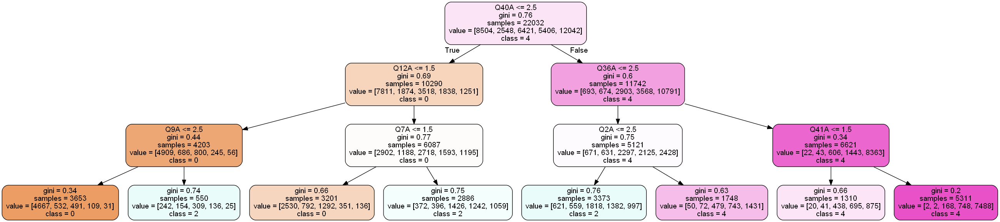

In [53]:
for category in ['Anxiety']:
    model = RandomForestClassifier(n_estimators=100, max_depth = 3)
    model.fit(question_dascat.iloc[:, :-3], question_dascat[category+'_cat'])

    estimator = model.estimators_[5]
    from sklearn.tree import export_graphviz
    from graphviz import Source
    # Export as dot file
    graph = Source(export_graphviz(estimator, out_file=None, 
                    feature_names = question_dascat.columns[:-3],
                    class_names = ['0', '1', '2', '3', '4'],
                    rounded = True, proportion = False, 
                    precision = 2, filled = True))
    
    png_bytes = graph.pipe(format='png')
    with open('tree_a.png','wb') as f:
        f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

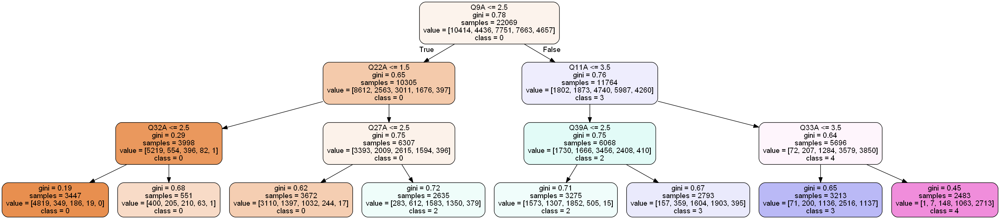

In [54]:
for category in ['Stress']:
    model = RandomForestClassifier(n_estimators=100, max_depth = 3)
    model.fit(question_dascat.iloc[:, :-3], question_dascat[category+'_cat'])

    estimator = model.estimators_[5]
    from sklearn.tree import export_graphviz
    from graphviz import Source
    # Export as dot file
    graph = Source(export_graphviz(estimator, out_file=None, 
                    feature_names = question_dascat.columns[:-3],
                    class_names = ['0', '1', '2', '3', '4'],
                    rounded = True, proportion = False, 
                    precision = 2, filled = True))
    
    png_bytes = graph.pipe(format='png')
    with open('tree_s.png','wb') as f:
        f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

Note that in each iteration of the code the trees generated will be different because the random forest is comprised of a committee of trees like the ones above.

## Predicting the most important questions for the depression category using different models

In [55]:
# Split dataset into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = \
train_test_split(question_dascat.iloc[:, :-3], question_dascat['Depression_cat'], test_size=0.2, random_state=0)

### Training a random forest classifier

Random state parameter is needed because random numbers are needed to generate random (bootstrap) samples on which trees are fitted. Each time a set of random numbers is generated, the program will generate a completely different set of random numbers which impacts your bootstrap samples and in turn the trees which are fitted. So in order to control the stochasticity involved in random number generation and to replicate the same set of random numbers every time we use a random seed. random_state is one parameter which allows you to set a random seed to your random number generation process in a random forest.

One main reason as to why need to set a random seed is for the purpose of replicability of the experiment. It is always better to set a random seed and start building your model, so that each and every time you build the model with the same data you get the exact same model.

This idea of setting a random seed is not only restricted to random forest, any algorithm which required random number (Neural Networks, Decision Trees etc.) will have this parameter. It does not need to be tuned however.

In [56]:
from sklearn import linear_model
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report 

clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0)
clf.fit(X_train, y_train)
# Make predictions for the test set
y_preds = clf.predict(X_test)

# Show accuracy score of the RF model
print('Accuracy for test:', accuracy_score(y_test, y_preds))

Accuracy for test: 0.9149606299212598


Impurity-based feature importances are often misleading for high cardinality features (e.g. features with many unique values). Permutation feature importance is an alternative model inspection technique and benefits from being model agnostic.

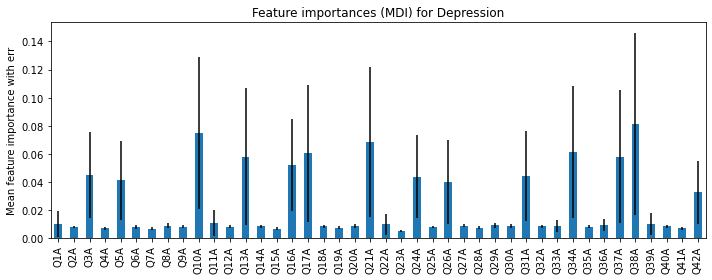

In [57]:
# Plot impurity-based feature importances

importances = clf.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)

forest_importances = pd.Series(importances, index=X_train.columns)
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax, figsize =(10, 4))
ax.set_title("Feature importances (MDI) for Depression")
ax.set_ylabel("Mean feature importance with err")
fig.tight_layout()

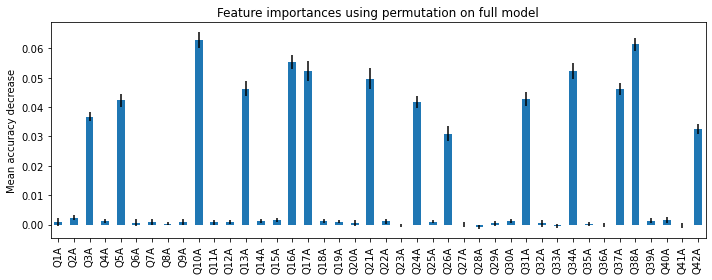

In [58]:
from sklearn.inspection import permutation_importance

#importances = clf.permutation_importance
#std = np.std([tree.permutation_importance for tree in clf.estimators_], axis=0)

result = permutation_importance(
    clf, X_test, y_test, n_repeats=10, random_state=0, n_jobs=2)
forest_importances = pd.Series(result.importances_mean, index=X_train.columns)

# Compute and plot feature importances
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax, figsize =(10, 4))
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [59]:
k = 6
k_imp_columns = list(forest_importances.sort_values()[::-1][:k].index)
for depth in range(1, 21):
    clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, max_depth=depth)
    clf.fit(X_train[k_imp_columns], y_train)
    y_preds = clf.predict(X_test[k_imp_columns])

    print('Max Depth = ', depth,', Accuracy achieved = ', accuracy_score(y_test, y_preds))

Max Depth =  1 , Accuracy achieved =  0.5503221188260559
Max Depth =  2 , Accuracy achieved =  0.6561202576950609
Max Depth =  3 , Accuracy achieved =  0.701646385110952
Max Depth =  4 , Accuracy achieved =  0.7224051539012168
Max Depth =  5 , Accuracy achieved =  0.7288475304223335
Max Depth =  6 , Accuracy achieved =  0.7332856120257695
Max Depth =  7 , Accuracy achieved =  0.7454545454545455
Max Depth =  8 , Accuracy achieved =  0.7473156764495347
Max Depth =  9 , Accuracy achieved =  0.7477451682176092
Max Depth =  10 , Accuracy achieved =  0.745311381531854
Max Depth =  11 , Accuracy achieved =  0.7418754473872584
Max Depth =  12 , Accuracy achieved =  0.7368647100930565
Max Depth =  13 , Accuracy achieved =  0.7368647100930565
Max Depth =  14 , Accuracy achieved =  0.7345740873299929
Max Depth =  15 , Accuracy achieved =  0.7342877594846099
Max Depth =  16 , Accuracy achieved =  0.7340014316392269
Max Depth =  17 , Accuracy achieved =  0.7347172512526843
Max Depth =  18 , Accurac

At max depth = 9, the model achieves the best accuracy.

In [60]:
k = 7

k_imp_columns = list(forest_importances.sort_values()[::-1][:k].index)
clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, max_depth=9)
clf.fit(X_train[k_imp_columns], y_train)
y_preds = clf.predict(X_test[k_imp_columns])

print('Top {} Columns: {}'.format(k, k_imp_columns))
print('Accuracy achieved = ', accuracy_score(y_test, y_preds))

Top 7 Columns: ['Q10A', 'Q38A', 'Q16A', 'Q17A', 'Q34A', 'Q21A', 'Q13A']
Accuracy achieved =  0.7793843951324266


Notice the model considers questions 10, 38, 16, 17, 34, 21 and 13 to be most indicative of a high depression score, if we were to use 7 items per subscale like the DASS-21. However in the clinical version of the DASS-21 the items chosen differ to ours, depression is measured with the following items (in order of factor loading from literature on factor analysis of the DASS-21): 21, 10, 3, 31, 17, 26, 42.

The only overlap exhibited by our choice of items is 21, 10 and 17, all of which are questions whose order did not change even in the 21-item version. This may suggest that the original authors of the survey had intended for these to be the most statistically significant answers and therefore did not change the order in which they are presented to the respondent, or that the ordering of the questions indeed affect the results given.

In [61]:
k = int(input('Enter number of features: '))

k_imp_columns = list(forest_importances.sort_values()[::-1][:k].index)
clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, max_depth=9)
clf.fit(X_train[k_imp_columns], y_train)
y_preds = clf.predict(X_test[k_imp_columns])

print('Top {} Columns: {}'.format(k, k_imp_columns))
print('Accuracy achieved = ', accuracy_score(y_test, y_preds))

Enter number of features: 6
Top 6 Columns: ['Q10A', 'Q38A', 'Q16A', 'Q17A', 'Q34A', 'Q21A']
Accuracy achieved =  0.7477451682176092


In [62]:
print(forest_importances.sort_values()[::-1])

Q10A    0.062892
Q38A    0.061446
Q16A    0.055476
Q17A    0.052283
Q34A    0.052169
Q21A    0.049749
Q13A    0.046285
Q37A    0.046099
Q31A    0.042849
Q5A     0.042405
Q24A    0.041761
Q3A     0.036779
Q42A    0.032570
Q26A    0.031009
Q2A     0.002391
Q40A    0.001560
Q15A    0.001518
Q14A    0.001303
Q4A     0.001288
Q39A    0.001288
Q30A    0.001246
Q18A    0.001217
Q22A    0.001088
Q19A    0.001045
Q25A    0.001016
Q1A     0.000974
Q9A     0.000902
Q12A    0.000902
Q7A     0.000859
Q11A    0.000716
Q20A    0.000601
Q6A     0.000587
Q29A    0.000372
Q32A    0.000372
Q8A     0.000272
Q35A    0.000157
Q27A   -0.000086
Q36A   -0.000186
Q23A   -0.000243
Q41A   -0.000286
Q33A   -0.000444
Q28A   -0.000773
dtype: float64


In other words, we can select the top 6 questions to predict depression score. The random forest classifier performs at around 71% accuracy in this case. Here we have chosen to select the minimum number of items that will preserve an accuracy above the threshold value of 70%, however the more items we include the better the predictions will be.

We then can use the test set to make predictions and show how our RF classifier model performs.

In [63]:
clf.predict_proba(X_test[k_imp_columns])

array([[9.92222196e-01, 6.74499057e-03, 1.03281350e-03, 0.00000000e+00,
        0.00000000e+00],
       [2.68888864e-02, 2.45914329e-01, 6.54873765e-01, 7.07564367e-02,
        1.56658363e-03],
       [9.92222196e-01, 6.74499057e-03, 1.03281350e-03, 0.00000000e+00,
        0.00000000e+00],
       ...,
       [0.00000000e+00, 3.02186469e-04, 1.25024380e-02, 3.85310742e-01,
        6.01884634e-01],
       [0.00000000e+00, 4.69042120e-05, 1.21525420e-02, 2.77145421e-01,
        7.10655133e-01],
       [0.00000000e+00, 0.00000000e+00, 3.23519896e-06, 2.11357561e-03,
        9.97883189e-01]])

In [64]:
predictions = []
for estimator_indx in range(100):
    estimator_preds = clf.estimators_[estimator_indx].predict(X_test[k_imp_columns])
    predictions.append(estimator_preds)
preds_df = pd.DataFrame(np.array(predictions).T, columns = ['estimator_'+str(indx) for indx in range(100)])

## Show how the RF performs by making a few predictions

We simulate overall depression score based on some unseen, synthetic data.

In [65]:
# Someone with few symptoms of depression filled in these answers
q21a = 0
q38a = 1
q10a = 2
q17a = 0
q37a = 0 
q13a = 1

clf.predict([[q21a, q38a, q10a, q17a, q37a, q13a]])
# Model predicted depression category score "0" based on those answers

array([0])

In [66]:
# Someone with lot of depressive symptoms filled in these answers
q21a = 3
q38a = 4
q10a = 4
q17a = 2
q37a = 3 
q13a = 4

clf.predict([[q21a, q38a, q10a, q17a, q37a, q13a]])
# Model predicted depression category score "4" based on those answers

array([4])

In [67]:
pred_res = pd.DataFrame({'Actual':y_test, 'Predicted':y_preds})
pred_res

,Actual,Predicted
29681,0,0
13215,2,2
34652,0,0
32229,0,0
28233,0,0
...,...,...
17692,1,2
21556,1,3
28897,4,4
20982,4,4


In [68]:
# Print out the mean absolute error
print('Mean Absolute Error:', round( metrics.mean_absolute_error(y_test, y_preds),2 ))
print('Mean Squared Error:', round( metrics.mean_squared_error(y_test, y_preds), 2))

# Calculate mean absolute percentage error
# Actual values are in some cases zero so taking the average in the denominator
error = np.sum(np.abs(y_preds - y_test))
average = np.sum(y_test)
mape = error / average

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.27
Mean Squared Error: 0.31
Accuracy: 99.88 %.


Classification accuracy is the ratio of correct predictions to total predictions made. The main problems with assessing a model based on classification accuracy alone is that is doesn't give the details needed to diagnose the performance of a model.

For example, when your data has more than 2 classes or an uneven number of classes, we do not know if a high accuracy score is due to one or two classes being neglected by the model and the score is achieved by predicting the most common class value.

### Confusion matrix

A confusion matrix is a table that is often used to describe the performance of a classification model (or "classifier") on a set of test data for which the true values are known. We can use it to evaluate the predictions made by the model because by definition the confusion matrix breaks down the number of correct and incorrect predictions by each class which gives insights into the types of errors made by the model.

Note each row of the matrix corresponds to a predicted class, each column of the matrix corresponds to an actual class.

In [69]:
# Function to plot and print confusion matrix
# Normalise by setting normalize to "True"

def plot_confusion_matrix(y_test, y_preds, classes,
                          normalize=True,
                          title=None,
                          cmap=mp.cm.Blues):
    
 
    title = 'Confusion Matrix'

    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_preds, labels=classes)

    fig, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    # ax.figure.colorbar(im, ax=ax)
    ax.figure.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=0)

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    
    plt.grid(b=None)
    
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import f1_score

0.7477451682176092

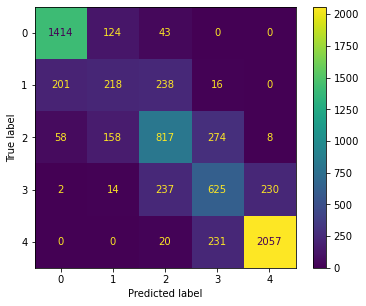

In [70]:
# Plot and print the confusion matrix RF with 6 parameters

model_d = RandomForestClassifier(random_state=0)
model_d.fit(X_train[k_imp_columns], y_train)
plot_confusion_matrix(model_d, X_test[k_imp_columns], y_test)
f1_score(y_test, y_preds, average = 'micro')

Predictions for "extremely severe" scores are 89% accurate, however much less so for scores of 1 and 3.

### Training a linear regression

In [71]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train[k_imp_columns], y_train)
y_preds = reg.predict(X_test[k_imp_columns])

# Cannot display an accuracy score because the function does not work for regressors i.e. it's a classification metric

# Print equation of the linear regression model
print('Depression = ', end='')
for c, x in zip(reg.coef_, k_imp_columns):
    print(str(round(c, 6)) + ' ' + x, end=' + ')
print(str(round(reg.intercept_, 6)))

Depression = 0.286415 Q10A + 0.183182 Q38A + 0.359835 Q16A + 0.238813 Q17A + 0.247389 Q34A + 0.181631 Q21A + -1.45281


In [72]:
from sklearn.metrics import mean_squared_error, r2_score

# The coefficients
print("Coefficients: \n", reg.coef_)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_preds))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_preds))

Coefficients: 
 [0.28641457 0.18318169 0.35983496 0.23881285 0.24738926 0.18163114]
Mean squared error: 0.31
Coefficient of determination: 0.87


Small MSE meaning prediction close to line of best fit/ regression line and the model has small errors. The model explains 87% of the variation of the outcomes.

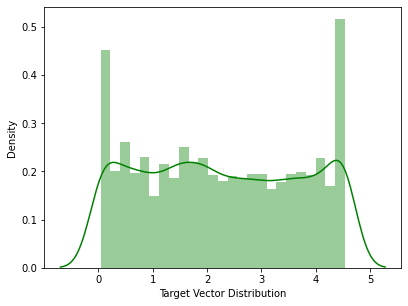

In [73]:
%%capture --no-display

SR_y = pd.Series(y_preds, name="Target Vector Distribution")

fig, ax = mp.subplots()
sb.distplot(SR_y, bins=25, color="g", ax=ax)
plt.show()

Linear model outputs discrete predictions. The predicted values are the expected values given the current set of predictors. Note the mental distance between "applied to me considerably" and "applied to me very much" may be much greater for some respondents than the difference between "applied to me sometimes" and "applied to me considerably" - this is taken into account when the target variable is encoded in ordinal regression but ordinal data sould not be treated as numerical.

#### Generate diagnostic plots for linear model

In [74]:
# Import modules

from matplotlib import rcParams
from statsmodels.nonparametric.smoothers_lowess import lowess

# Input

model = smf.ols(formula='Depression_cat ~ Q3A + Q5A + Q10A + Q13A + Q16A + Q17A + Q21A + Q24A + Q26A + Q31A + Q34A + Q37A + Q38A + Q42A', data=question_dascat)
results = model.fit()

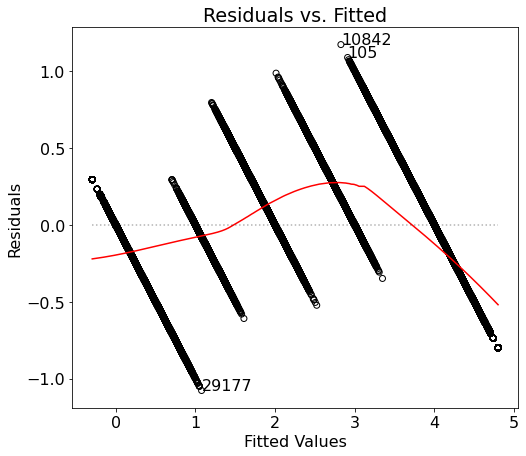

In [75]:
# Residuals plot

residuals = results.resid
fitted = results.fittedvalues
smoothed = lowess(residuals,fitted)
top3 = abs(residuals).sort_values(ascending = False)[:3]

mp.rcParams.update({'font.size': 16})
mp.rcParams["figure.figsize"] = (8,7)
fig, ax = plt.subplots()
ax.scatter(fitted, residuals, edgecolors = 'k', facecolors = 'none')
ax.plot(smoothed[:,0],smoothed[:,1],color = 'r')
ax.set_ylabel('Residuals')
ax.set_xlabel('Fitted Values')
ax.set_title('Residuals vs. Fitted')
ax.plot([min(fitted),max(fitted)],[0,0],color = 'k',linestyle = ':', alpha = .3)

for i in top3.index:
    ax.annotate(i,xy=(fitted[i],residuals[i]))

mp.show()

As a consequence of the dependent variable having only a few values, residuals against fitted values are logically spread along parallel lines. Constant variance does not appear to be an issue here as bunching of points occur around the center of residual bands and not at the ends of fitted value bands. We will assume homoscedasticity is not violated.

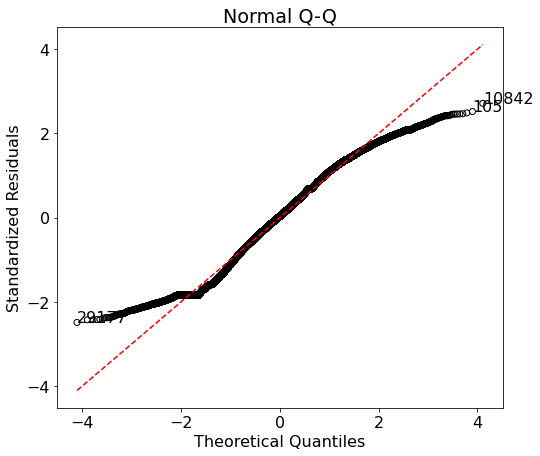

In [76]:
# Q-Q plot

sorted_student_residuals = pd.Series(results.get_influence().resid_studentized_internal)
sorted_student_residuals.index = results.resid.index
sorted_student_residuals = sorted_student_residuals.sort_values(ascending = True)
df = pd.DataFrame(sorted_student_residuals)
df.columns = ['sorted_student_residuals']
df['theoretical_quantiles'] = stats.probplot(df['sorted_student_residuals'], dist = 'norm', fit = False)[0]
rankings = abs(df['sorted_student_residuals']).sort_values(ascending = False)
top3 = rankings[:3]

fig, ax = plt.subplots()
x = df['theoretical_quantiles']
y = df['sorted_student_residuals']
ax.scatter(x,y, edgecolor = 'k',facecolor = 'none')
ax.set_title('Normal Q-Q')
ax.set_ylabel('Standardized Residuals')
ax.set_xlabel('Theoretical Quantiles')
ax.plot([np.min([x,y]),np.max([x,y])],[np.min([x,y]),np.max([x,y])], color = 'r', ls = '--')
for val in top3.index:
    ax.annotate(val,xy=(df['theoretical_quantiles'].loc[val],df['sorted_student_residuals'].loc[val]))
plt.show()

Suffers from lighter tails, points are not normally distributed; more likely to see extreme values than to be expected if the data was normally distributed.

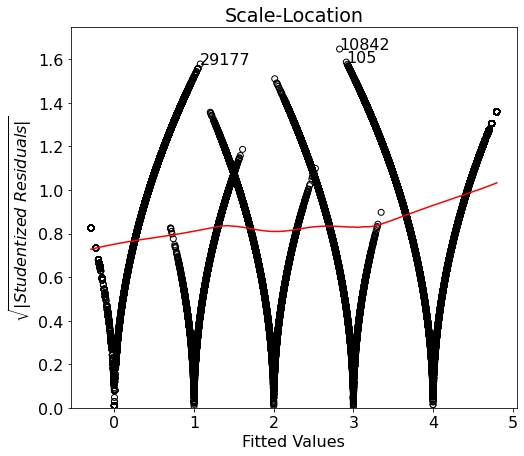

In [77]:
# Scale-location plot


student_residuals = results.get_influence().resid_studentized_internal
sqrt_student_residuals = pd.Series(np.sqrt(np.abs(student_residuals)))
sqrt_student_residuals.index = results.resid.index
smoothed = lowess(sqrt_student_residuals,fitted)
top3 = abs(sqrt_student_residuals).sort_values(ascending = False)[:3]

fig, ax = plt.subplots()
ax.scatter(fitted, sqrt_student_residuals, edgecolors = 'k', facecolors = 'none')
ax.plot(smoothed[:,0],smoothed[:,1],color = 'r')
ax.set_ylabel('$\sqrt{|Studentized \ Residuals|}$')
ax.set_xlabel('Fitted Values')
ax.set_title('Scale-Location')
ax.set_ylim(0,max(sqrt_student_residuals)+0.1)
for i in top3.index:
    ax.annotate(i,xy=(fitted[i],sqrt_student_residuals[i]))
plt.show()

There are signs of non-linearity and heteroscedasticity.

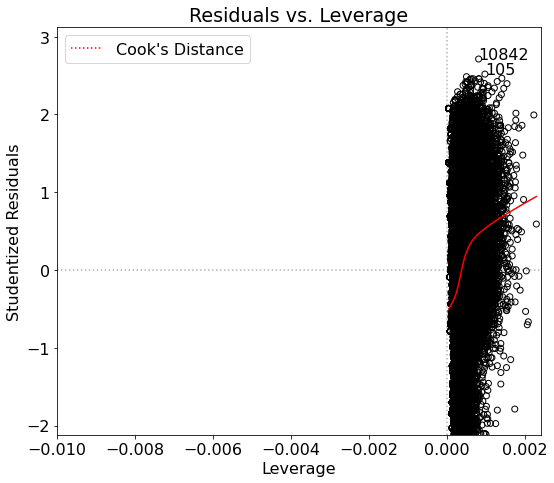

In [78]:
# Residuals vs leverage

student_residuals = pd.Series(results.get_influence().resid_studentized_internal)
student_residuals.index = results.resid.index
df = pd.DataFrame(student_residuals)
df.columns = ['student_residuals']
df['leverage'] = results.get_influence().hat_matrix_diag
smoothed = lowess(df['student_residuals'],df['leverage'])
sorted_student_residuals = abs(df['student_residuals']).sort_values(ascending = False)
top3 = sorted_student_residuals[:3]

fig, ax = plt.subplots()
x = df['leverage']
y = df['student_residuals']
xpos = max(x)+max(x)*0.01  
ax.scatter(x, y, edgecolors = 'k', facecolors = 'none')
ax.plot(smoothed[:,0],smoothed[:,1],color = 'r')
ax.set_ylabel('Studentized Residuals')
ax.set_xlabel('Leverage')
ax.set_title('Residuals vs. Leverage')
ax.set_ylim(min(y)-min(y)*0.15,max(y)+max(y)*0.15)
ax.set_xlim(-0.01,max(x)+max(x)*0.05)
plt.tight_layout()
for val in top3.index:
    ax.annotate(val,xy=(x.loc[val],y.loc[val]))

cooksx = np.linspace(min(x), xpos, 50)
p = len(results.params)
poscooks1y = np.sqrt((p*(1-cooksx))/cooksx)
poscooks05y = np.sqrt(0.5*(p*(1-cooksx))/cooksx)
negcooks1y = -np.sqrt((p*(1-cooksx))/cooksx)
negcooks05y = -np.sqrt(0.5*(p*(1-cooksx))/cooksx)

ax.plot(cooksx,poscooks1y,label = "Cook's Distance", ls = ':', color = 'r')
ax.plot(cooksx,poscooks05y, ls = ':', color = 'r')
ax.plot(cooksx,negcooks1y, ls = ':', color = 'r')
ax.plot(cooksx,negcooks05y, ls = ':', color = 'r')
ax.plot([0,0],ax.get_ylim(), ls=":", alpha = .3, color = 'k')
ax.plot(ax.get_xlim(), [0,0], ls=":", alpha = .3, color = 'k')
ax.annotate('1.0', xy = (xpos, poscooks1y[-1]), color = 'r')
ax.annotate('0.5', xy = (xpos, poscooks05y[-1]), color = 'r')
ax.annotate('1.0', xy = (xpos, negcooks1y[-1]), color = 'r')
ax.annotate('0.5', xy = (xpos, negcooks05y[-1]), color = 'r')
ax.legend()
plt.show()

There are no leverage points with Cook's distance greater than 0.5 in this plot and no points that are far out from the rest of the data.

In [79]:
def get_best_distribution(data):
    dist_names = ["norm", "lognorm", "logistic", "invgauss"]
    dist_results = []
    params = {}
    for dist_name in dist_names:
        dist = getattr(stats, dist_name)
        param = dist.fit(data)

        params[dist_name] = param
        # Applying the Kolmogorov-Smirnov test
        D, p = stats.kstest(data, dist_name, args=param)
        print("p value for "+dist_name+" = "+str(p))
        dist_results.append((dist_name, p))

    # select the best fitted distribution
    best_dist, best_p = (max(dist_results, key=lambda item: item[1]))
    # store the name of the best fit and its p value

    print("Best fitting distribution: "+str(best_dist))
    print("Best p value: "+ str(best_p))
    print("Parameters for the best fit: "+ str(params[best_dist]))

    return best_dist, best_p, params[best_dist]

In [80]:
with np.errstate(divide='ignore'):
    np.float64(1.0) / 0.0
    
get_best_distribution(y_preds)

p value for norm = 3.9959742395413875e-27
p value for lognorm = 1.2102822799188996e-29
p value for logistic = 1.297238999408647e-34
p value for invgauss = 7.2033536727199714e-34
Best fitting distribution: norm
Best p value: 3.9959742395413875e-27
Parameters for the best fit: (2.2741109296319673, 1.4467779842876793)


('norm', 3.9959742395413875e-27, (2.2741109296319673, 1.4467779842876793))

In [81]:
with np.errstate(divide='ignore'):
    np.float64(1.0) / 0.0
    
get_best_distribution(y_test)

p value for norm = 4.1649198478722206e-240
p value for lognorm = 4.970898443813151e-237
p value for logistic = 1.5344550380334862e-198
p value for invgauss = 6.0429409145891574e-217
Best fitting distribution: logistic
Best p value: 1.5344550380334862e-198
Parameters for the best fit: (2.3476503652900775, 0.9542961331369592)


('logistic', 1.5344550380334862e-198, (2.3476503652900775, 0.9542961331369592))

Target factor best modelled with normal distribution with parameters mean = 2.274 and variance = 1.447. Recall that linear regression typically is only advised for continuous dependent variables, however it is possible although not best practice to model predicted overall depression score at the outcome variable. This is partly because score is increasing on a scale of 0 to 4, so the interval between scores are meaningful and interpretable.

However, we are encountering problems with the diagnostic plots and normality assumptions because the range of scores is small i.e. only 5 possible values. Perhaps transforming the target variable by aplying a log transformation is more suitable, furthermore we implement a ridge regression model following transformation as linear regression may not be the most suitable for highly intercorrelated predictors. Finally, try a logistic regression because from results in the cell above it is suggested that the logistic regression may be the best fit for the target variable.

#### Log ransformation on target variable in the linear model

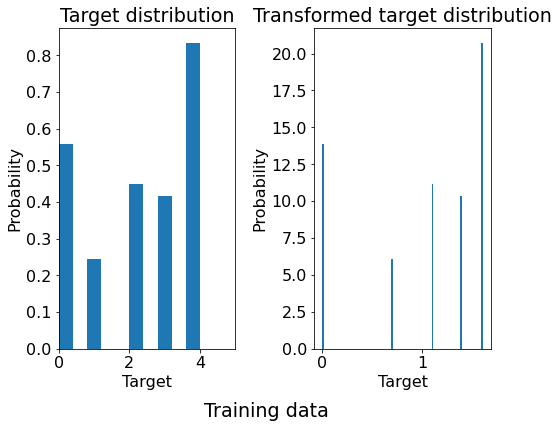

In [82]:
# Observe effects of transforming the target variable in regression models

from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import median_absolute_error, r2_score
from sklearn.utils.fixes import parse_version

# `normed` is being deprecated in favor of `density` in histograms
if parse_version(matplotlib.__version__) >= parse_version("2.1"):
    density_param = {"density": True}
else:
    density_param = {"normed": True}
    

# Modify target y such that we apply a logarithmic and exponential function to obtain non-linear targets
y = y_train
y_trans = np.log1p(y)

f, (ax0, ax1) = mp.subplots(1, 2)

ax0.hist(y, bins=10, **density_param)
ax0.set_xlim([0, 5])
ax0.set_ylabel("Probability")
ax0.set_xlabel("Target")
ax0.set_title("Target distribution")

ax1.hist(y_trans, bins=100, **density_param)
ax1.set_ylabel("Probability")
ax1.set_xlabel("Target")
ax1.set_title("Transformed target distribution")

f.suptitle("Training data", y=0.06, x=0.53)
f.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

The pattern does not change with a log transformation.

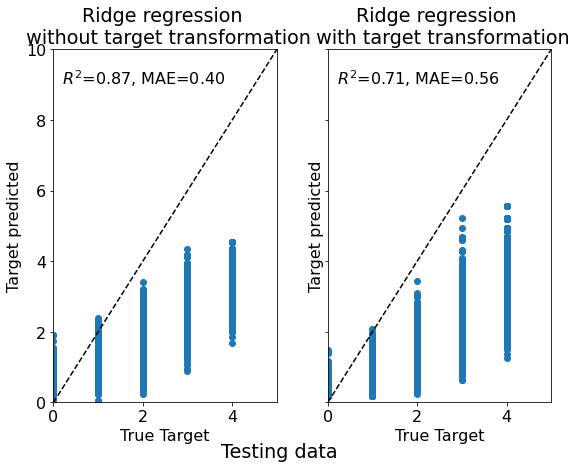

In [83]:
f, (ax0, ax1) = plt.subplots(1, 2, sharey=True)
# Use linear model
regr = RidgeCV()
regr.fit(X_train[k_imp_columns], y_train)
y_pred = regr.predict(X_test[k_imp_columns])
# Plot results
ax0.scatter(y_test, y_pred)
ax0.plot([0, 5], [0, 10], "--k")
ax0.set_ylabel("Target predicted")
ax0.set_xlabel("True Target")
ax0.set_title("Ridge regression \n without target transformation")
ax0.text(
    0.2,
    9,
    r"$R^2$=%.2f, MAE=%.2f"
    % (r2_score(y_test, y_pred), median_absolute_error(y_test, y_pred)),
)
ax0.set_xlim([0, 5])
ax0.set_ylim([0, 10])
# Transform targets and use same linear model
regr_trans = TransformedTargetRegressor(
    regressor=RidgeCV(), func=np.log1p, inverse_func=np.expm1
)
regr_trans.fit(X_train[k_imp_columns], y_train)
y_pred = regr_trans.predict(X_test[k_imp_columns])

ax1.scatter(y_test, y_pred)
ax1.plot([0, 5], [0, 10], "--k")
ax1.set_ylabel("Target predicted")
ax1.set_xlabel("True Target")
ax1.set_title("Ridge regression \n with target transformation")
ax1.text(
    0.2,
    9,
    r"$R^2$=%.2f, MAE=%.2f"
    % (r2_score(y_test, y_pred), median_absolute_error(y_test, y_pred)),
)
ax1.set_xlim([0, 5])
ax1.set_ylim([0, 10])

f.suptitle("Testing data", y=0.035)
f.tight_layout(pad=1.0, w_pad=2.0, h_pad=1.5)

Log transformation does not give better predictions as can be seen from a lower R-squared value and greater median absolute error (MAE).

We deduce that regression is not suitable for the analysis at hand and rather, we should be using classifiers. Ridge regression has a classifier alternative which is faster than logistic regression.

### Train a ridge classifier

In [84]:
# Ridge classifier

from sklearn import linear_model
from sklearn.linear_model import RidgeClassifier
RidgeClf = RidgeClassifier().fit(X_train[k_imp_columns], y_train)
RidgeClf.score(X_test[k_imp_columns], y_test)

0.5695060844667144

What about the logistic regression? We see if that yields improved fitted values.

### Train a logistic regression

In [85]:
from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

# Logistic regression

from sklearn.linear_model import LogisticRegression

# Make an instance of the model
logisticRegr = LogisticRegression()

logisticRegr.fit(X_train[k_imp_columns], y_train)
predictions = logisticRegr.predict(X_test[k_imp_columns])
# Use score method to get accuracy of model
score = logisticRegr.score(X_test[k_imp_columns], y_test)
print(score)
print(logisticRegr.coef_)
print(logisticRegr.intercept_)

0.7507516105941303
[[-2.14900788 -1.45338787 -2.73078584 -1.52095287 -1.65219724 -1.73261503]
 [-0.99615329 -0.64169104 -1.21395673 -0.61143839 -0.72777622 -0.73366803]
 [-0.02600576  0.02028665 -0.02419098  0.01014113  0.02593262  0.03891721]
 [ 1.07017536  0.6723354   1.29643183  0.75271503  0.78796978  0.80536816]
 [ 2.10099157  1.40245686  2.67250171  1.3695351   1.56607105  1.62199768]]
[ 22.03981913  11.87724513   2.83345616 -10.32224487 -26.42827555]


#### Linear regression model with predictions rounded to match classes

In [86]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train[k_imp_columns], y_train)
# Round predictions into score classes
categorize = lambda x: round(x) if x<=4 else 4
y_preds = reg.predict(X_test[k_imp_columns])
y_preds = np.array(list(map(categorize, y_preds)))

# Diplay accuracy score of the linear regression model
print(accuracy_score(y_test, y_preds))

# Print equation of the linear regression model
print('Depression = ', end='')
for c, x in zip(reg.coef_, k_imp_columns):
    print(str(round(c, 6)) + ' ' + x, end=' + ')
print(str(round(reg.intercept_, 6)))

0.681746599856836
Depression = 0.286415 Q10A + 0.183182 Q38A + 0.359835 Q16A + 0.238813 Q17A + 0.247389 Q34A + 0.181631 Q21A + -1.45281


In [87]:
# Compare the first 20 predictions between the RF, linear regressor, ridge classfier and logistic regression

xt = X_test[k_imp_columns]

pred1 = clf.predict(xt[:20])
pred2 = reg.predict(xt[:20])
pred3 = RidgeClf.predict(xt[:20])
pred4 = logisticRegr.predict(xt[:20])

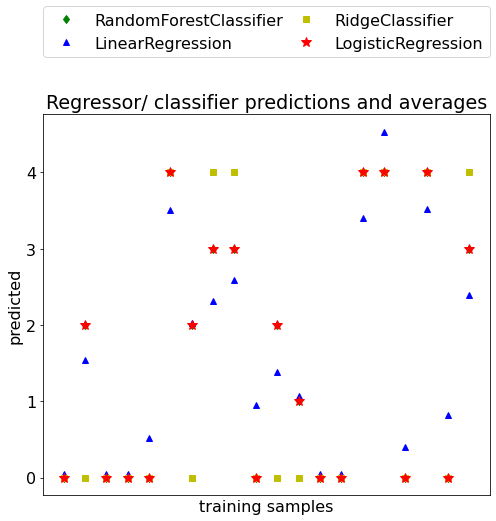

In [88]:
# Plot the results

mp.figure()
mp.plot(pred1, "gd", label="RandomForestClassifier")
mp.plot(pred2, "b^", label="LinearRegression")
mp.plot(pred3, "ys", label="RidgeClassifier")
mp.plot(pred4, "r*", ms=10, label="LogisticRegression")

mp.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
mp.ylabel("predicted")
mp.xlabel("training samples")
mp.legend(bbox_to_anchor=(0,1.15,1,0.5), loc="lower left",
                mode="expand", borderaxespad=0, ncol=2)
mp.title("Regressor/ classifier predictions and averages")

mp.show()

Predictions generated by logistic regression mostly overlaps with that of random forest, exhibiting roughly the same level of predictive accuracy. The ridge classifier predictions tend to differ quite a lot from the rest of the models, suggesting it is the most unsuitable for this dataset.

Now we replicate the modelling process for the other two mental disorder categories.

## Predicting the most important questions for the anxiety category using different models

In [89]:
# Split the training and testing set

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = \
train_test_split(question_dascat.iloc[:, :-3], question_dascat['Anxiety_cat'], test_size=0.2, random_state=0)

In [90]:
# Train RF on full set of features

from sklearn import linear_model
from sklearn.metrics import accuracy_score

# Train a RF classifier
clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0)
clf.fit(X_train, y_train)
y_preds = clf.predict(X_test)

# Display feature accuracy
print(accuracy_score(y_test, y_preds))

0.8405153901216893


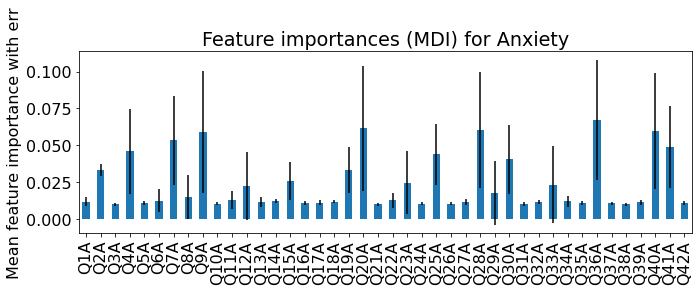

In [91]:
# Plot feature importances using mean decrease in impurity

importances = clf.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)

forest_importances = pd.Series(importances, index=X_train.columns)
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax, figsize =(10, 4))
ax.set_title("Feature importances (MDI) for Anxiety")
ax.set_ylabel("Mean feature importance with err")
fig.tight_layout()

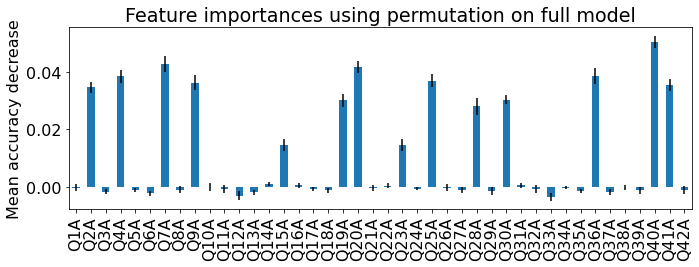

In [92]:
from sklearn.inspection import permutation_importance

#importances = clf.permutation_importance
#std = np.std([tree.permutation_importance for tree in clf.estimators_], axis=0)

result = permutation_importance(
    clf, X_test, y_test, n_repeats=10, random_state=0, n_jobs=2)
forest_importances = pd.Series(result.importances_mean, index=X_train.columns)

# Compute and plot permutation feature importances
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax, figsize =(10, 4))
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [93]:
# Incrementally increase the depth of trees
k = 6
k_imp_columns = list(forest_importances.sort_values()[::-1][:k].index)
for depth in range(1, 21):
    clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, max_depth=depth)
    clf.fit(X_train[k_imp_columns], y_train)
    y_preds = clf.predict(X_test[k_imp_columns])

    print('Max Depth = ', depth,', Accuracy achieved = ', accuracy_score(y_test, y_preds))

Max Depth =  1 , Accuracy achieved =  0.5861130994989263
Max Depth =  2 , Accuracy achieved =  0.6211882605583393
Max Depth =  3 , Accuracy achieved =  0.6638511095204008
Max Depth =  4 , Accuracy achieved =  0.6837508947745168
Max Depth =  5 , Accuracy achieved =  0.7009305654974947
Max Depth =  6 , Accuracy achieved =  0.7130994989262706
Max Depth =  7 , Accuracy achieved =  0.7169649248389406
Max Depth =  8 , Accuracy achieved =  0.7204008589835361
Max Depth =  9 , Accuracy achieved =  0.7259842519685039
Max Depth =  10 , Accuracy achieved =  0.7267000715819614
Max Depth =  11 , Accuracy achieved =  0.7259842519685039
Max Depth =  12 , Accuracy achieved =  0.7239799570508232
Max Depth =  13 , Accuracy achieved =  0.7232641374373657
Max Depth =  14 , Accuracy achieved =  0.7224051539012168
Max Depth =  15 , Accuracy achieved =  0.7222619899785254
Max Depth =  16 , Accuracy achieved =  0.7224051539012168
Max Depth =  17 , Accuracy achieved =  0.7224051539012168
Max Depth =  18 , Accur

Maximum depth = 10 gives best accuracy.

In [94]:
k = 7

k_imp_columns = list(forest_importances.sort_values()[::-1][:k].index)
clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, max_depth=10)
clf.fit(X_train[k_imp_columns], y_train)
y_preds = clf.predict(X_test[k_imp_columns])

print('Top {} Columns: {}'.format(k, k_imp_columns))
print('Accuracy achieved = ', accuracy_score(y_test, y_preds))

Top 7 Columns: ['Q40A', 'Q7A', 'Q20A', 'Q36A', 'Q4A', 'Q25A', 'Q9A']
Accuracy achieved =  0.7451682176091625


In [95]:
k = int(input('Enter number of features: '))

k_imp_columns = list(forest_importances.sort_values()[::-1][:k].index)
clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, max_depth=10)
clf.fit(X_train[k_imp_columns], y_train)
y_preds = clf.predict(X_test[k_imp_columns])

print('Top {} Columns: {}'.format(k, k_imp_columns))
print('Accuracy achieved = ', accuracy_score(y_test, y_preds))

Enter number of features: 6
Top 6 Columns: ['Q40A', 'Q7A', 'Q20A', 'Q36A', 'Q4A', 'Q25A']
Accuracy achieved =  0.7267000715819614


It is still possible to include 6 questions which describes around 71% of the original dataset. The top 6 questions for predicting anxiety are: 40, 7, 20, 36, 4 and 25.

The questions suggested by the model which overlaps with the DASS-21 are: 40, 20, 4 and 25. The questions that are deemed important by the DASS-21 but are not included by the random forest were mainly those that described physical symptoms of anxiety.

In [96]:
# Show actual variable importance values

print(forest_importances.sort_values()[::-1])

Q40A    0.050594
Q7A     0.042820
Q20A    0.041675
Q36A    0.038726
Q4A     0.038440
Q25A    0.037008
Q9A     0.036335
Q41A    0.035490
Q2A     0.034674
Q30A    0.030408
Q19A    0.030107
Q28A    0.028031
Q23A    0.014631
Q15A    0.014603
Q14A    0.001016
Q16A    0.000458
Q31A    0.000458
Q22A    0.000301
Q10A   -0.000072
Q38A   -0.000229
Q34A   -0.000344
Q26A   -0.000344
Q1A    -0.000358
Q21A   -0.000429
Q24A   -0.000659
Q32A   -0.000687
Q11A   -0.000787
Q17A   -0.000888
Q8A    -0.001016
Q42A   -0.001045
Q5A    -0.001088
Q27A   -0.001117
Q18A   -0.001174
Q39A   -0.001217
Q35A   -0.001346
Q29A   -0.001518
Q3A    -0.001646
Q37A   -0.001804
Q13A   -0.001976
Q6A    -0.002262
Q12A   -0.003092
Q33A   -0.003536
dtype: float64


In [97]:
# Show predictions
pred_res = pd.DataFrame({'Actual':y_test, 'Predicted':y_preds})
pred_res

,Actual,Predicted
29681,0,0
13215,2,2
34652,0,0
32229,0,0
28233,3,2
...,...,...
17692,1,2
21556,2,4
28897,4,4
20982,2,0


In [98]:
# Print out the mean absolute error
print('Mean Absolute Error:', round( metrics.mean_absolute_error(y_test, y_preds),2 ))
print('Mean Squared Error:', round( metrics.mean_squared_error(y_test, y_preds), 2))

# Calculate mean absolute percentage error
# Actual values are in some cases zero so taking the average in the denominator
error = np.sum(np.abs(y_preds - y_test))
average = np.sum(y_test)
mape = error / average

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.33
Mean Squared Error: 0.44
Accuracy: 99.86 %.


0.7267000715819614

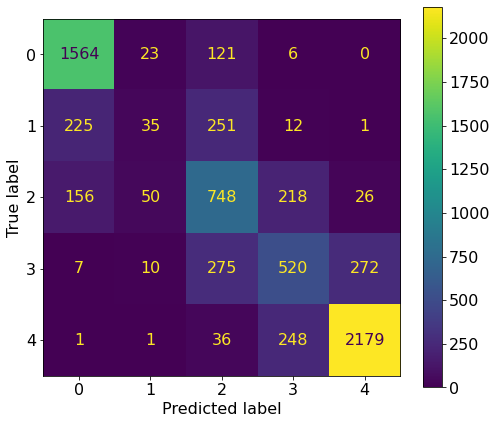

In [99]:
# Plot and print the confusion matrix RF with 6 parameters

model_a = RandomForestClassifier(random_state=0)
model_a.fit(X_train[k_imp_columns], y_train)
plot_confusion_matrix(model_a, X_test[k_imp_columns], y_test)
f1_score(y_test, y_preds, average = 'micro')

The model is able to predict 88% of "extremely severe" scores correctly and does similarly well for "normal" scores, however significantly falls short on predicting overall anxiety scores of 1 and 3.

In [100]:
# Train linear regression

from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train[k_imp_columns], y_train)
y_preds = reg.predict(X_test[k_imp_columns])

# Cannot display an accuracy score because the function does not work for regressors i.e. it's a classification metric

# Print equation of the linear regression model
print('Anxiety = ', end='')
for c, x in zip(reg.coef_, k_imp_columns):
    print(str(round(c, 6)) + ' ' + x, end=' + ')
print(str(round(reg.intercept_, 6)))

Anxiety = 0.403565 Q40A + 0.287852 Q7A + 0.280759 Q20A + 0.286095 Q36A + 0.226862 Q4A + 0.255136 Q25A + -1.610659


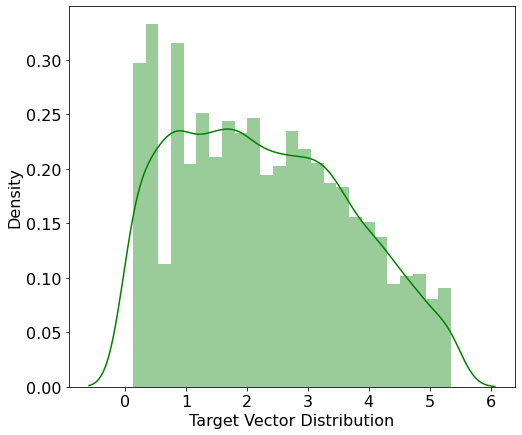

In [101]:
%%capture --no-display

SR_y = pd.Series(y_preds, name="Target Vector Distribution")

fig, ax = mp.subplots()
sb.distplot(SR_y, bins=25, color="g", ax=ax)
plt.show()

In [102]:
from sklearn.metrics import mean_squared_error, r2_score

# The coefficients
print("Coefficients: \n", reg.coef_)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_preds))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_preds))

Coefficients: 
 [0.40356471 0.28785249 0.28075942 0.28609477 0.2268619  0.2551357 ]
Mean squared error: 0.52
Coefficient of determination: 0.80


In [103]:
# Estimate distribution of target variables

with np.errstate(divide='ignore'):
    np.float64(1.0) / 0.0
    
get_best_distribution(y_test)

p value for norm = 1.52320554842503e-272
p value for lognorm = 1.2829972730295564e-271
p value for logistic = 7.411570448130435e-223
p value for invgauss = 1.5915222232454781e-258
Best fitting distribution: logistic
Best p value: 7.411570448130435e-223
Parameters for the best fit: (2.3893750340325295, 0.9810586390400757)


('logistic', 7.411570448130435e-223, (2.3893750340325295, 0.9810586390400757))

In [104]:
# Train a ridge classifier

from sklearn import linear_model
from sklearn.linear_model import RidgeClassifier
RidgeClf = RidgeClassifier().fit(X_train[k_imp_columns], y_train)
RidgeClf.score(X_test[k_imp_columns], y_test)

0.6105941302791696

In [105]:
# Train a logistic regression

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

from sklearn.linear_model import LogisticRegression

# Make an instance of the model
logisticRegr = LogisticRegression()

logisticRegr.fit(X_train[k_imp_columns], y_train)
predictions = logisticRegr.predict(X_test[k_imp_columns])
# Use score method to get accuracy of model
score = logisticRegr.score(X_test[k_imp_columns], y_test)
print(score)
print(logisticRegr.coef_)
print(logisticRegr.intercept_)

0.7354330708661417
[[-1.91489499e+00 -2.29936621e+00 -1.58763803e+00 -1.75219075e+00
  -1.87059785e+00 -1.57362813e+00]
 [-8.19084598e-01 -1.00299179e+00 -6.37956530e-01 -7.23156899e-01
  -7.46956543e-01 -6.92750089e-01]
 [-1.97674372e-02 -6.50690884e-02 -2.44425087e-02  1.10990919e-03
   1.28737783e-03  3.68036253e-03]
 [ 9.08760657e-01  1.09432022e+00  7.32122440e-01  7.78961246e-01
   8.53781815e-01  7.28742721e-01]
 [ 1.84498637e+00  2.27310687e+00  1.51791463e+00  1.69527649e+00
   1.76248520e+00  1.53395513e+00]]
[ 19.58131368   9.18685714   2.24737025  -8.6897253  -22.32581577]


In [106]:
# Linear regression with rounded and categorised predictions

from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train[k_imp_columns], y_train)
# Round predictions into score classes
categorize = lambda x: round(x) if x<=4 else 4
y_preds = reg.predict(X_test[k_imp_columns])
y_preds = np.array(list(map(categorize, y_preds)))

# Diplay accuracy score of the linear regression model
print(accuracy_score(y_test, y_preds))

# Print equation of the linear regression model
print('Anxiety = ', end='')
for c, x in zip(reg.coef_, k_imp_columns):
    print(str(round(c, 6)) + ' ' + x, end=' + ')
print(str(round(reg.intercept_, 6)))

0.5576234788833214
Anxiety = 0.403565 Q40A + 0.287852 Q7A + 0.280759 Q20A + 0.286095 Q36A + 0.226862 Q4A + 0.255136 Q25A + -1.610659


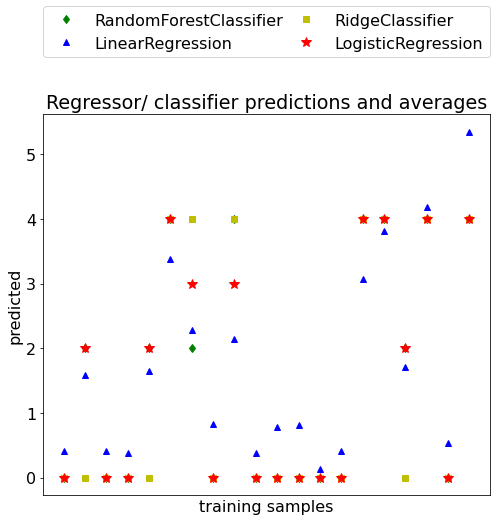

In [107]:
# Compare the first 20 predictions between the RF, linear regressor, ridge classfier and logistic regression

xt = X_test[k_imp_columns]

pred1 = clf.predict(xt[:20])
pred2 = reg.predict(xt[:20])
pred3 = RidgeClf.predict(xt[:20])
pred4 = logisticRegr.predict(xt[:20])

# Plot the results

mp.figure()
mp.plot(pred1, "gd", label="RandomForestClassifier")
mp.plot(pred2, "b^", label="LinearRegression")
mp.plot(pred3, "ys", label="RidgeClassifier")
mp.plot(pred4, "r*", ms=10, label="LogisticRegression")

mp.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
mp.ylabel("predicted")
mp.xlabel("training samples")
mp.legend(bbox_to_anchor=(0,1.15,1,0.5), loc="lower left",
                mode="expand", borderaxespad=0, ncol=2)
mp.title("Regressor/ classifier predictions and averages")

mp.show()

## Finally, predict which questions are most important in the stress category

In [108]:
# Split training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = \
train_test_split(question_dascat.iloc[:, :-3], question_dascat['Stress_cat'], test_size=0.2, random_state=0)

In [109]:
from sklearn import linear_model
from sklearn.metrics import accuracy_score

# Train a RF classifier
clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0)
clf.fit(X_train, y_train)
y_preds = clf.predict(X_test)

# Display feature accuracy
print(accuracy_score(y_test, y_preds))

0.8801717967072298


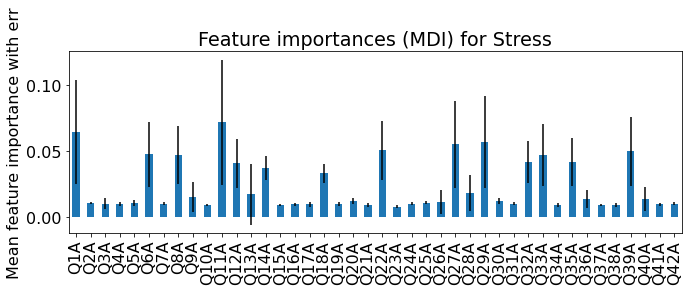

In [110]:
# Plot feature importances using mean decrease in impurity

importances = clf.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)

forest_importances = pd.Series(importances, index=X_train.columns)
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax, figsize =(10, 4))
ax.set_title("Feature importances (MDI) for Stress")
ax.set_ylabel("Mean feature importance with err")
fig.tight_layout()

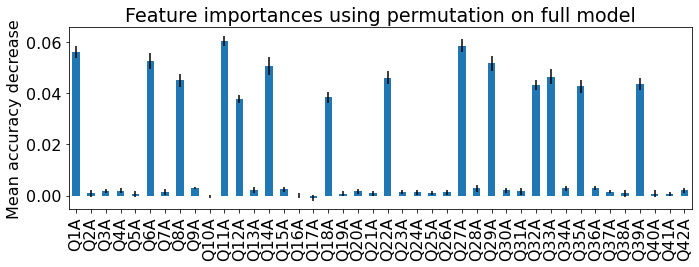

In [111]:
from sklearn.inspection import permutation_importance

#importances = clf.permutation_importance
#std = np.std([tree.permutation_importance for tree in clf.estimators_], axis=0)

result = permutation_importance(
    clf, X_test, y_test, n_repeats=10, random_state=0, n_jobs=2)
forest_importances = pd.Series(result.importances_mean, index=X_train.columns)

# Compute and plot permutation feature importances
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax, figsize =(10, 4))
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [112]:
k = 6
k_imp_columns = list(forest_importances.sort_values()[::-1][:k].index)
for depth in range(1, 21):
    clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, max_depth=depth)
    clf.fit(X_train[k_imp_columns], y_train)
    y_preds = clf.predict(X_test[k_imp_columns])

    print('Max Depth = ', depth,', Accuracy achieved = ', accuracy_score(y_test, y_preds))

Max Depth =  1 , Accuracy achieved =  0.48990694345025054
Max Depth =  2 , Accuracy achieved =  0.6251968503937008
Max Depth =  3 , Accuracy achieved =  0.6405153901216893
Max Depth =  4 , Accuracy achieved =  0.6539727988546886
Max Depth =  5 , Accuracy achieved =  0.6598425196850394
Max Depth =  6 , Accuracy achieved =  0.6632784538296349
Max Depth =  7 , Accuracy achieved =  0.6725841088045812
Max Depth =  8 , Accuracy achieved =  0.6732999284180387
Max Depth =  9 , Accuracy achieved =  0.6758768790264853
Max Depth =  10 , Accuracy achieved =  0.674874731567645
Max Depth =  11 , Accuracy achieved =  0.6649964209019327
Max Depth =  12 , Accuracy achieved =  0.6599856836077308
Max Depth =  13 , Accuracy achieved =  0.662705798138869
Max Depth =  14 , Accuracy achieved =  0.6614173228346457
Max Depth =  15 , Accuracy achieved =  0.6611309949892628
Max Depth =  16 , Accuracy achieved =  0.6615604867573371
Max Depth =  17 , Accuracy achieved =  0.6615604867573371
Max Depth =  18 , Accura

In [113]:
k = 7

k_imp_columns = list(forest_importances.sort_values()[::-1][:k].index)
clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, max_depth=9)
clf.fit(X_train[k_imp_columns], y_train)
y_preds = clf.predict(X_test[k_imp_columns])

print('Top {} Columns: {}'.format(k, k_imp_columns))
print('Accuracy achieved = ', accuracy_score(y_test, y_preds))

Top 7 Columns: ['Q11A', 'Q27A', 'Q1A', 'Q6A', 'Q29A', 'Q14A', 'Q33A']
Accuracy achieved =  0.7398711524695777


In [114]:
k = int(input('Enter number of features: '))

k_imp_columns = list(forest_importances.sort_values()[::-1][:k].index)
clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, max_depth=9)
clf.fit(X_train[k_imp_columns], y_train)
y_preds = clf.predict(X_test[k_imp_columns])

print('Top {} Columns: {}'.format(k, k_imp_columns))
print('Accuracy achieved = ', accuracy_score(y_test, y_preds))

Enter number of features: 6
Top 6 Columns: ['Q11A', 'Q27A', 'Q1A', 'Q6A', 'Q29A', 'Q14A']
Accuracy achieved =  0.6758768790264853


Top features chosen to predict stress score are: questions 11, 27, 1, 6, 29 and 14. The only common item both suggested by the model and included on the DASS-21 is item 6 "I tended to over-react to situations" which did not change positions in the long and short form of the survey. However it was ranked 7th in CFA as opposed to 4th in RF feature importance.

In [115]:
# Show actual variable importance values

print(forest_importances.sort_values()[::-1])

Q11A    0.060501
Q27A    0.058611
Q1A     0.056034
Q6A     0.052641
Q29A    0.051739
Q14A    0.050537
Q33A    0.046514
Q22A    0.046127
Q8A     0.045082
Q39A    0.043579
Q32A    0.043236
Q35A    0.042749
Q18A    0.038397
Q12A    0.037752
Q36A    0.002978
Q9A     0.002921
Q28A    0.002878
Q34A    0.002835
Q15A    0.002434
Q13A    0.002190
Q30A    0.002133
Q42A    0.002090
Q4A     0.001933
Q3A     0.001804
Q20A    0.001718
Q31A    0.001646
Q37A    0.001618
Q7A     0.001389
Q23A    0.001374
Q26A    0.001260
Q24A    0.001246
Q25A    0.001002
Q2A     0.000931
Q21A    0.000916
Q38A    0.000888
Q40A    0.000787
Q19A    0.000787
Q5A     0.000759
Q41A    0.000558
Q16A    0.000014
Q10A   -0.000229
Q17A   -0.000787
dtype: float64


The RF classifier is again accurate at descibing the data 68% of the time.

Compared to the DASS-21, the RF chose questions 11, 27, 1, 6, 29 and 14 as its optimal features.

In [116]:
# Show predictions
pred_res = pd.DataFrame({'Actual':y_test, 'Predicted':y_preds})
pred_res

,Actual,Predicted
29681,0,0
13215,1,1
34652,0,0
32229,0,0
28233,2,3
...,...,...
17692,0,0
21556,0,0
28897,4,4
20982,1,0


In [117]:
# Print out the mean absolute error
print('Mean Absolute Error:', round( metrics.mean_absolute_error(y_test, y_preds),2 ))
print('Mean Squared Error:', round( metrics.mean_squared_error(y_test, y_preds), 2))

# Calculate mean absolute percentage error
# Actual values are in some cases zero so taking the average in the denominator
error = np.sum(np.abs(y_preds - y_test))
average = np.sum(y_test)
mape = error / average

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.36
Mean Squared Error: 0.42
Accuracy: 99.8 %.


0.6758768790264853

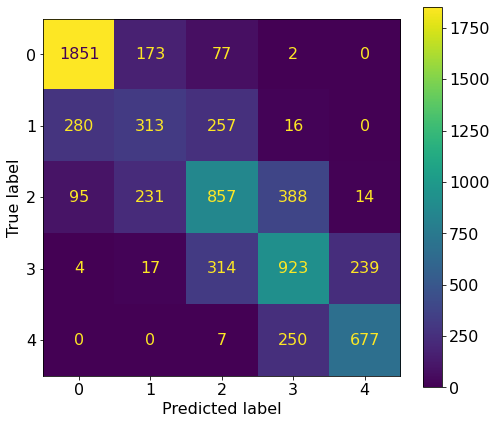

In [118]:
# Plot and print the confusion matrix RF with 6 parameters

model_s = RandomForestClassifier(random_state=0)
model_s.fit(X_train[k_imp_columns], y_train)
plot_confusion_matrix(model_s, X_test[k_imp_columns], y_test)
f1_score(y_test, y_preds, average = 'micro')

In [119]:
# Train linear regression

from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train[k_imp_columns], y_train)
y_preds = reg.predict(X_test[k_imp_columns])

# Cannot display an accuracy score because the function does not work for regressors i.e. it's a classification metric

# Print equation of the linear regression model
print('Stress = ', end='')
for c, x in zip(reg.coef_, k_imp_columns):
    print(str(round(c, 6)) + ' ' + x, end=' + ')
print(str(round(reg.intercept_, 6)))

Stress = 0.22224 Q11A + 0.312998 Q27A + 0.257341 Q1A + 0.250155 Q6A + 0.320274 Q29A + 0.224639 Q14A + -2.406888


In [120]:
from sklearn.metrics import mean_squared_error, r2_score

# The coefficients
print("Coefficients: \n", reg.coef_)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_preds))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_preds))

Coefficients: 
 [0.22223957 0.31299801 0.25734079 0.25015478 0.32027427 0.22463878]
Mean squared error: 0.35
Coefficient of determination: 0.82


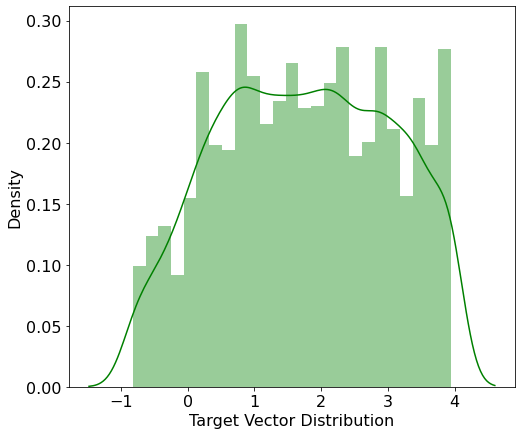

In [121]:
%%capture --no-display

SR_y = pd.Series(y_preds, name="Target Vector Distribution")

fig, ax = mp.subplots()
sb.distplot(SR_y, bins=25, color="g", ax=ax)
plt.show()

This target variable distribution is closest to being normal

In [122]:
# Estimate distribution of target variables

with np.errstate(divide='ignore'):
    np.float64(1.0) / 0.0
    
get_best_distribution(y_test)

p value for norm = 5.558322438950252e-228
p value for lognorm = 0.0
p value for logistic = 7.577971147763574e-204
p value for invgauss = 2.682654015711e-311
Best fitting distribution: logistic
Best p value: 7.577971147763574e-204
Parameters for the best fit: (1.7471468551674003, 0.8713650122814488)


('logistic', 7.577971147763574e-204, (1.7471468551674003, 0.8713650122814488))

In [123]:
# Train a ridge classifier

from sklearn import linear_model
from sklearn.linear_model import RidgeClassifier
RidgeClf = RidgeClassifier().fit(X_train[k_imp_columns], y_train)
RidgeClf.score(X_test[k_imp_columns], y_test)

0.5033643521832498

In [124]:
# Train a logistic regression

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

from sklearn.linear_model import LogisticRegression

# Make an instance of the model
logisticRegr = LogisticRegression()

logisticRegr.fit(X_train[k_imp_columns], y_train)
predictions = logisticRegr.predict(X_test[k_imp_columns])
# Use score method to get accuracy of model
score = logisticRegr.score(X_test[k_imp_columns], y_test)
print(score)
print(logisticRegr.coef_)
print(logisticRegr.intercept_)

0.6800286327845383
[[-1.24638514 -1.99261371 -1.63105309 -1.53686231 -1.98990179 -1.49056093]
 [-0.47566088 -0.88293968 -0.71621954 -0.73408562 -0.95404462 -0.63557149]
 [ 0.14442093  0.072169    0.03309769  0.07642495  0.07816642  0.16588263]
 [ 0.54237167  0.85550132  0.64824747  0.731462    0.87521573  0.58428476]
 [ 1.03525342  1.94788307  1.66592747  1.46306098  1.99056426  1.37596502]]
[ 24.92658669  13.00755733   1.06208459  -9.9560057  -29.04022291]


In [125]:
# Linear regression with rounded and categorised predictions

from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train[k_imp_columns], y_train)
# Round predictions into score classes
categorize = lambda x: round(x) if x<=4 else 4
y_preds = reg.predict(X_test[k_imp_columns])
y_preds = np.array(list(map(categorize, y_preds)))

# Diplay accuracy score of the linear regression model
print(accuracy_score(y_test, y_preds))

# Print equation of the linear regression model
print('Stress = ', end='')
for c, x in zip(reg.coef_, k_imp_columns):
    print(str(round(c, 6)) + ' ' + x, end=' + ')
print(str(round(reg.intercept_, 6)))

0.5848246241947029
Stress = 0.22224 Q11A + 0.312998 Q27A + 0.257341 Q1A + 0.250155 Q6A + 0.320274 Q29A + 0.224639 Q14A + -2.406888


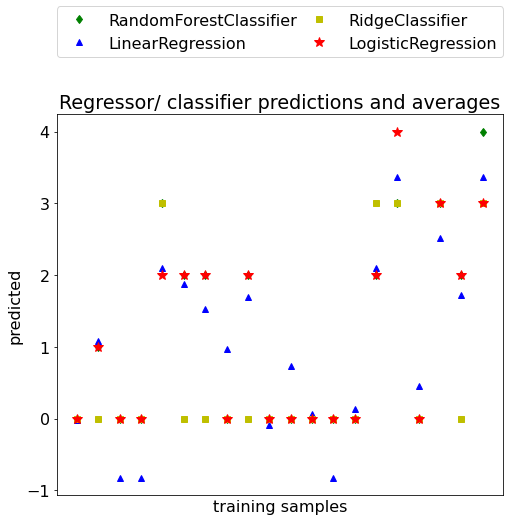

In [126]:
# Compare the first 20 predictions between the RF, linear regressor, ridge classfier and logistic regression

xt = X_test[k_imp_columns]

pred1 = clf.predict(xt[:20])
pred2 = reg.predict(xt[:20])
pred3 = RidgeClf.predict(xt[:20])
pred4 = logisticRegr.predict(xt[:20])

# Plot the results

mp.figure()
mp.plot(pred1, "gd", label="RandomForestClassifier")
mp.plot(pred2, "b^", label="LinearRegression")
mp.plot(pred3, "ys", label="RidgeClassifier")
mp.plot(pred4, "r*", ms=10, label="LogisticRegression")

mp.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
mp.ylabel("predicted")
mp.xlabel("training samples")
mp.legend(bbox_to_anchor=(0,1.15,1,0.5), loc="lower left",
                mode="expand", borderaxespad=0, ncol=2)
mp.title("Regressor/ classifier predictions and averages")

mp.show()

For all three mental health disorder categories, the model suggests including 6 questions for each category is advisable without losing too much of the information encapsulated by the original dataset.